In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib Inline

import warnings
warnings.filterwarnings("ignore")

In [2]:
pd.set_option("display.max_rows",None)
pd.set_option("display.max_columns",None)
df1=pd.read_csv("Data_file.csv")
df1.head(4)

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
0,1,0,21408I70789,272.0,3055.050,3065.150,220.13,260.13,2.0,0.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,29.0,29.0,UPW,2016-07-20
1,2,1,76462I70374,712.0,12122.000,12124.750,3691.26,3691.26,20.0,0.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,0.0,0.0,0,0,1,12,12.0,0.0,1.0,12,12,0.0,0.0,0.0,UPW,2016-08-10
2,3,1,17943I70372,535.0,1398.000,1398.000,900.13,900.13,3.0,0.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,0.0,0.0,0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.0,0.0,UPW,2016-08-19
3,4,1,55773I70781,241.0,21.228,21.228,159.42,159.42,41.0,0.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,0.0,0.0,UPW,2016-06-06


In [3]:
#Making a new copy to data frame so that original file remain constant
df=pd.DataFrame(data=df1)
df.tail(4)

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
209589,209590,1,95583I84455,1075.0,36.936000,36.936,1728.36,1728.36,4.0,0.0,773,4,1.0,3092.0,773.0,161.30,6,2,4038,773.0,111.80,0.0,0.0,0,0,3,18,6.0,0.0,3.0,18,6,0.0,1.0,1.000000,UPW,2016-06-12
209590,209591,1,28556I85350,1013.0,11843.111667,11904.350,5861.83,8893.20,3.0,0.0,1539,5,8.0,9334.0,1539.0,51.13,11,5,18592,1539.0,47.13,0.0,0.0,0,0,4,42,12.0,0.0,6.0,54,12,0.0,4.0,3.833333,UPW,2016-07-29
209591,209592,1,59712I82733,1732.0,12488.228333,12574.370,411.83,984.58,2.0,38.0,773,5,4.0,12154.0,773.0,164.00,6,4,17941,2410.5,100.00,0.0,0.0,1,0,2,18,12.0,0.0,3.0,24,12,0.0,0.0,10.500000,UPW,2016-07-25
209592,209593,1,65061I85339,1581.0,4489.362000,4534.820,483.92,631.20,13.0,0.0,7526,2,1.0,9065.0,4532.5,356.70,3,19,16591,7526.0,392.20,0.0,0.0,0,0,2,18,12.0,0.0,2.0,18,12,0.0,0.0,0.000000,UPW,2016-07-07


In [4]:
# However columns contains serial number hence deleting the Unnamed column
df.drop(['Unnamed: 0'],inplace=True,axis=1)

In [5]:
print("Data ",type(df),"\n")
print("Data Shape ",df.shape,"\n")
print("Data Size ",df.size,"\n")
df.info()

Data  <class 'pandas.core.frame.DataFrame'> 

Data Shape  (209593, 36) 

Data Size  7545348 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209593 entries, 0 to 209592
Data columns (total 36 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   label                 209593 non-null  int64  
 1   msisdn                209593 non-null  object 
 2   aon                   209593 non-null  float64
 3   daily_decr30          209593 non-null  float64
 4   daily_decr90          209593 non-null  float64
 5   rental30              209593 non-null  float64
 6   rental90              209593 non-null  float64
 7   last_rech_date_ma     209593 non-null  float64
 8   last_rech_date_da     209593 non-null  float64
 9   last_rech_amt_ma      209593 non-null  int64  
 10  cnt_ma_rech30         209593 non-null  int64  
 11  fr_ma_rech30          209593 non-null  float64
 12  sumamnt_ma_rech30     209593 non-null  float64
 13  medianamnt

# Observation Shows

- Float Values - 21 Columns
- Integer Values - 12 Columns
- Object Values - 3 Columns

#### Memory Used : 58 MB


# ABOUT COLUMNS 

1. label : Flag indicating whether the user paid back the credit amount within 5 days of issuing the loan{1:success, 0:failure}
2. msisdn :	mobile number of user
3. aon	:age on cellular network in days
4. daily_decr30 :	Daily amount spent from main account, averaged over last 30 days (in Indonesian Rupiah)
5. daily_decr90	:   Daily amount spent from main account, averaged over last 90 days (in Indonesian Rupiah)
6. Rental30	    :    Average main account balance over last 30 days
7. rental90     :	Average main account balance over last 90 days
8. last_rech_date_ma	: Number of days till last recharge of main account
9. last_rech_date_da	: Number of days till last recharge of data account
10. last_rech_amt_ma	: Amount of last recharge of main account (in Indonesian Rupiah)
11. cnt_ma_rech30	    : Number of times main account got recharged in last 30 days
12. fr_ma_rech30	    : Frequency of main account recharged in last 30 days
13. sumamnt_ma_rech30	: Total amount of recharge in main account over last 30 days (in Indonesian Rupiah)
14. medianamnt_ma_rech30: Median of amount of recharges done in main account over last 30 days at user level(Indonesian Rupiah)
15. medianmarechprebal30: Median of main account balance just before recharge in last 30 days at user level(Indonesian Rupiah)
16. cnt_ma_rech90  :	Number of times main account got recharged in last 90 days
17. fr_ma_rech90   :	Frequency of main account recharged in last 90 days
18. sumamnt_ma_rech90	: Total amount of recharge in main account over last 90 days (in Indonasian Rupiah)
19. medianamnt_ma_rech90: Median of amount of recharges done in main account over last 90 days at user level(Indonasian Rupiah)
20. medianmarechprebal90: Median of main account balance just before recharge in last 90 days at user level (Indonasian Rupiah)
21. cnt_da_rech30 :	Number of times data account got recharged in last 30 days
22. fr_da_rech30  : Frequency of data account recharged in last 30 days
23. cnt_da_rech90 :	Number of times data account got recharged in last 90 days
24. fr_da_rech90  :	Frequency of data account recharged in last 90 days
25. cnt_loans30	  : Number of loans taken by user in last 30 days
26. amnt_loans30  :	Total amount of loans taken by user in last 30 days
27. maxamnt_loans30: Maximum amount of loan taken by the user in last 30 days
28. medianamnt_loans30 :	Median of amounts of loan taken by the user in last 30 days
29. cnt_loans90	  : Number of loans taken by user in last 90 days
30. amnt_loans90  :	Total amount of loans taken by user in last 90 days
31. maxamnt_loans90 : Maximum amount of loan taken by the user in last 90 days
32. medianamnt_loans90	: Median of amounts of loan taken by the user in last 90 days
33. payback30	: Average payback time in days over last 30 days
34. payback90	: Average payback time in days over last 90 days
35. pcircle	    : Telecom circle
36. pdate	    : Date


# Null Values

In [6]:
df.isnull().sum().sum()

0

- Found NO Nill Values, all content are found to be intact

# Checking Unique Values

In [7]:
df.nunique()

label                        2
msisdn                  186243
aon                       4507
daily_decr30            147025
daily_decr90            158669
rental30                132148
rental90                141033
last_rech_date_ma         1186
last_rech_date_da         1174
last_rech_amt_ma            70
cnt_ma_rech30               71
fr_ma_rech30              1083
sumamnt_ma_rech30        15141
medianamnt_ma_rech30       510
medianmarechprebal30     30428
cnt_ma_rech90              110
fr_ma_rech90                89
sumamnt_ma_rech90        31771
medianamnt_ma_rech90       608
medianmarechprebal90     29785
cnt_da_rech30             1066
fr_da_rech30              1072
cnt_da_rech90               27
fr_da_rech90                46
cnt_loans30                 40
amnt_loans30                48
maxamnt_loans30           1050
medianamnt_loans30           6
cnt_loans90               1110
amnt_loans90                69
maxamnt_loans90              3
medianamnt_loans90           6
payback3

# Checking Unique Values

1. Categorical Values.
2. Numberical Values.

In [8]:
for i in df.columns:
    if df[i].dtypes=='object':
        print(i,"\n",df[i].unique(),"\n","***"*10)

msisdn 
 ['21408I70789' '76462I70374' '17943I70372' ... '22758I85348' '59712I82733'
 '65061I85339'] 
 ******************************
pcircle 
 ['UPW'] 
 ******************************
pdate 
 ['2016-07-20' '2016-08-10' '2016-08-19' '2016-06-06' '2016-06-22'
 '2016-07-02' '2016-07-05' '2016-08-05' '2016-06-15' '2016-06-08'
 '2016-06-12' '2016-06-20' '2016-06-29' '2016-06-16' '2016-08-03'
 '2016-06-24' '2016-07-04' '2016-07-03' '2016-07-01' '2016-08-08'
 '2016-06-26' '2016-06-23' '2016-07-06' '2016-07-09' '2016-06-10'
 '2016-06-07' '2016-06-27' '2016-08-11' '2016-06-30' '2016-06-19'
 '2016-07-26' '2016-08-14' '2016-06-14' '2016-06-21' '2016-06-25'
 '2016-06-28' '2016-06-11' '2016-07-27' '2016-07-23' '2016-08-16'
 '2016-08-15' '2016-06-02' '2016-06-05' '2016-08-02' '2016-07-28'
 '2016-07-18' '2016-08-18' '2016-07-16' '2016-07-29' '2016-07-21'
 '2016-06-03' '2016-06-13' '2016-08-01' '2016-07-13' '2016-07-10'
 '2016-06-09' '2016-07-15' '2016-07-11' '2016-08-09' '2016-08-12'
 '2016-07-22' '2

In [9]:
# droping pcircle as its wont add much values on prediction

df.drop(['pcircle'],inplace=True,axis=1)

In [10]:
# Float Columns:

for i in df.columns:
    if df[i].dtypes=='float64':
        print(i,"\n",df[i].unique(),"\n","***"*10)

aon 
 [2.72000000e+02 7.12000000e+02 5.35000000e+02 ... 8.03380622e+05
 5.81435484e+05 8.11881373e+05] 
 ******************************
daily_decr30 
 [ 3055.05       12122.          1398.         ... 11843.11166667
 12488.22833333  4489.362     ] 
 ******************************
daily_decr90 
 [ 3065.15       12124.75        1398.         ...   151.87233333
 12574.37        4534.82      ] 
 ******************************
rental30 
 [ 220.13 3691.26  900.13 ... 5861.83  411.83  483.92] 
 ******************************
rental90 
 [ 260.13 3691.26  900.13 ... 1728.36 8893.2   984.58] 
 ******************************
last_rech_date_ma 
 [2.00000000e+00 2.00000000e+01 3.00000000e+00 ... 7.67980563e+05
 6.11678500e+05 5.90843122e+05] 
 ******************************
last_rech_date_da 
 [0.00000000e+00 5.50000000e+01 6.30000000e+01 ... 8.09043117e+05
 7.99233445e+05 6.36529127e+05] 
 ******************************
fr_ma_rech30 
 [2.10000000e+01 0.00000000e+00 2.00000000e+00 ... 9.05481035e+0

medianmarechprebal90 
 [  7.5   61.04  66.32 ...  27.66 118.97 392.2 ] 
 ******************************
cnt_da_rech30 
 [    0.         30721.46377061 91764.39171424 ... 45457.72373676
 35132.66812544 61002.42134533] 
 ******************************
fr_da_rech30 
 [0.00000000e+00 7.23845092e+05 9.00000000e+00 ... 7.44924811e+05
 7.04094118e+05 5.09386303e+05] 
 ******************************
maxamnt_loans30 
 [6.00000000e+00 1.20000000e+01 0.00000000e+00 ... 9.28645017e+04
 5.42592657e+04 9.69272433e+04] 
 ******************************
medianamnt_loans30 
 [0.  1.  0.5 2.  1.5 3. ] 
 ******************************
cnt_loans90 
 [2.00000000e+00 1.00000000e+00 7.00000000e+00 ... 3.02706822e+03
 4.47977118e+03 2.04790245e+03] 
 ******************************
medianamnt_loans90 
 [0.  1.  0.5 2.  1.5 3. ] 
 ******************************
payback30 
 [29.          0.          2.33333333 ... 56.75       64.33333333
  5.61538462] 
 ******************************
payback90 
 [29.          0. 

# Observation: 

- No NAN Values
- Shows 0 Values in content


In [11]:
#checking total zero present in rows

df[df['daily_decr30']==0].sum()

label                                                                 533
msisdn                  11094I8445144230I9084232707I8864926376I7078951...
aon                                                       33485051.482386
daily_decr30                                                          0.0
daily_decr90                                                     13778.59
rental30                                                       4798918.66
rental90                                                       5381896.08
last_rech_date_ma                                         14374133.464991
last_rech_date_da                                         12276368.993905
last_rech_amt_ma                                                  1016094
cnt_ma_rech30                                                         338
fr_ma_rech30                                              18831858.135467
sumamnt_ma_rech30                                                530049.0
medianamnt_ma_rech30                  

- Maximum Rows Contain 0

In [12]:
# replacing values of zero with np.nan

for i in df.columns[1:]:
    df.replace(0, np.nan, inplace=True)

# Checking Duplicated Rows:

In [13]:
df.duplicated().sum()

1

In [14]:
df[df.duplicated()]

,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pdate
198194,1.0,82741I90849,367.0,3136.666667,3136.666667,3320.95,3320.95,1.0,NaN,770.0,5.0,1.0,8666.0,1539.0,96.0,5.0,1.0,8666.0,1539.0,96.0,NaN,NaN,NaN,NaN,4.0,24.0,6.0,NaN,4.0,24.0,6.0,NaN,42.75,42.75,2016-07-23


In [15]:
# first Match
df[df.duplicated(keep='first')]

,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pdate
198194,1.0,82741I90849,367.0,3136.666667,3136.666667,3320.95,3320.95,1.0,NaN,770.0,5.0,1.0,8666.0,1539.0,96.0,5.0,1.0,8666.0,1539.0,96.0,NaN,NaN,NaN,NaN,4.0,24.0,6.0,NaN,4.0,24.0,6.0,NaN,42.75,42.75,2016-07-23


In [16]:
# second Match
df[df.duplicated(keep='last')]

,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pdate
51093,1.0,82741I90849,367.0,3136.666667,3136.666667,3320.95,3320.95,1.0,NaN,770.0,5.0,1.0,8666.0,1539.0,96.0,5.0,1.0,8666.0,1539.0,96.0,NaN,NaN,NaN,NaN,4.0,24.0,6.0,NaN,4.0,24.0,6.0,NaN,42.75,42.75,2016-07-23


### Observations:

- Observation Shows Duplicated Rows.
- row 198194, 51093 are quite similar

In [17]:
df.drop_duplicates( inplace=True)
df.duplicated().sum()

0

#### - Duplicated Rows Rectified

# Missing Data With Missing Percentage

In [18]:
Missing_Value=df.isnull().sum()
percentage_Missing=df.isnull().sum()/df.shape[0]*100 #missing Value

views=pd.DataFrame(data={" Missing Values ":Missing_Value," Missing Percentage ":percentage_Missing},index=None)
views

,Missing Values,Missing Percentage
label,26162,12.482347
msisdn,0,0.000000
aon,0,0.000000
daily_decr30,4144,1.977175
daily_decr90,4063,1.938528
rental30,7566,3.609871
rental90,6918,3.300698
last_rech_date_ma,20743,9.896847
last_rech_date_da,202860,96.788045
last_rech_amt_ma,20995,10.017081


# Observations

- Rows Maximum Null Values having 90 percent data Missing.

In [19]:
# Rows dropped with 90 percentage Missing Data
df.drop(['last_rech_date_da','cnt_da_rech30','fr_da_rech30','cnt_da_rech90','fr_da_rech30','cnt_da_rech90',
         'fr_da_rech90','medianamnt_loans30','medianamnt_loans90'],inplace=True,axis=1)

In [20]:
# Finding all empty rows in Target variable 

df[df['label']==' ']

,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90,pdate


#  Replacing Nan Values

In [21]:
df['label']=df['label'].fillna((0)) # np.nan were changed to 0 again

# Replacing Using Simple Imputer

In [22]:
from sklearn.impute import SimpleImputer
s_mean=SimpleImputer(missing_values=np.nan, strategy='mean')
s_median=SimpleImputer(missing_values=np.nan, strategy='median')
s_fre=SimpleImputer(missing_values=np.nan, strategy='most_frequent')

for i in df.columns:
    if df[i].dtype=='float64':
        df[i]=s_mean.fit_transform(df[i].values.reshape(-1,1))
        
for i in df.columns:
    if df[i].dtype=='object':
        df[i]=s_fre.fit_transform(df[i].values.reshape(-1,1))

# After Imputation checking null values

In [23]:
df.isnull().sum().sum()

0

# Visualization for Null Values

<AxesSubplot:>

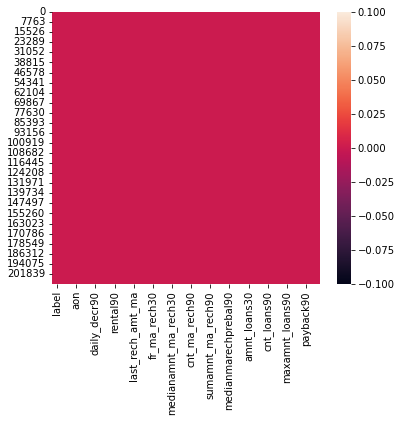

In [24]:
plt.figure(figsize=(6,5))
sns.heatmap(df.isnull())

In [25]:
# perform conversion to Integer from float
df['label'] = [int(i) for i in df['label']]

In [26]:
# converting the pdate to datetime function.

df['pdate']=pd.to_datetime(df['pdate'])

# segrigation on date,month and year for further Research
df['year']=df['pdate'].dt.year
df['Month']=df['pdate'].dt.month
df['Day']=df['pdate'].dt.day

#### Not droping the pdate columns

In [27]:
df.drop(['msisdn','pdate'], inplace=True,axis=1) # deleting as its won't add much values to the prediction

In [28]:
Categorical=[]
Numerical=[]

for i in df.columns:
    if df[i].dtypes=='object':
        Categorical.append(i)
    else:
        Numerical.append(i)
        
print(Categorical,"\n"*2,Numerical)
        

[] 

 ['label', 'aon', 'daily_decr30', 'daily_decr90', 'rental30', 'rental90', 'last_rech_date_ma', 'last_rech_amt_ma', 'cnt_ma_rech30', 'fr_ma_rech30', 'sumamnt_ma_rech30', 'medianamnt_ma_rech30', 'medianmarechprebal30', 'cnt_ma_rech90', 'fr_ma_rech90', 'sumamnt_ma_rech90', 'medianamnt_ma_rech90', 'medianmarechprebal90', 'cnt_loans30', 'amnt_loans30', 'maxamnt_loans30', 'cnt_loans90', 'amnt_loans90', 'maxamnt_loans90', 'payback30', 'payback90', 'year', 'Month', 'Day']


- Note: After dropping those Non-Valueable columns, Now we are left Only Numerical Columns

# EDA (Exploratory Data Analysis)

## Univariate Analysis

1    183430
0     26162
Name: label, dtype: int64

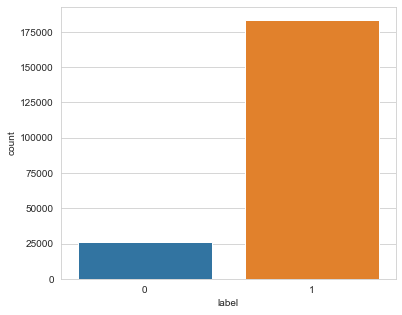

In [29]:
plt.figure(figsize=(6,5))
sns.set_style("whitegrid")
sns.countplot(x='label',data=df)
df['label'].value_counts()

- 1 Shows   183430 Maximum Payments are Clear
- 0 Shows   26162 Defaulter

(-48.0, 'and', 999860.755167902)

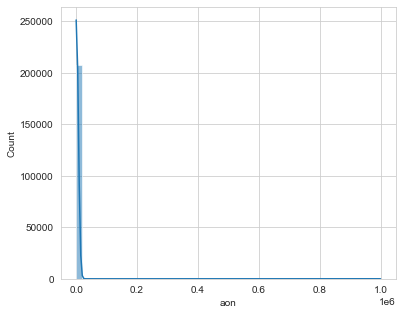

In [30]:
plt.figure(figsize=(6,5))
sns.histplot(x='aon',data=df,kde=True,bins=50)
df['aon'].min(),"and",df['aon'].max()

Distribution lies Maximum at 0

- age on cellular network in days distribution lies between (-48.0, 'and', 999860.755167902)

(-93.0126666666667, 'and', 265926.0)

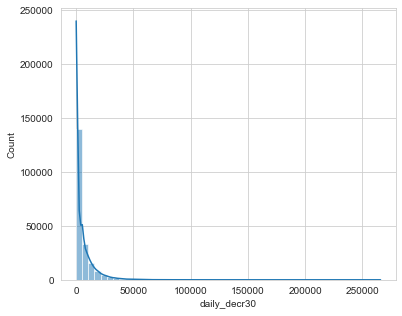

In [31]:
plt.figure(figsize=(6,5))
sns.histplot(x='daily_decr30',data=df,kde=True,bins=50)
df['daily_decr30'].min(),"and",df['daily_decr30'].max()

 - Daily amount spent from main account, averaged over last 30 days (in Indonesian Rupiah) Lies between (-93.0126666666667, 'and', 265926.0)

(-93.0126666666667, 'and', 320630.0)

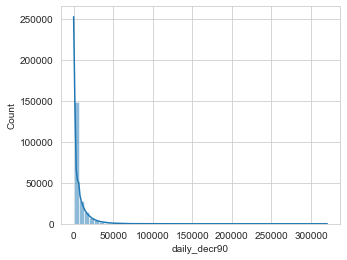

In [32]:
plt.figure(figsize=(5,4))
sns.histplot(x='daily_decr90',data=df,kde=True,bins=50)
df['daily_decr90'].min(),"and",df['daily_decr90'].max()

- Daily amount spent from main account, averaged over last 90 days (in Indonesian Rupiah),Lies Between (-93.0126666666667, 'and', 320630.0)

(-23737.14, 'and', 198926.11)

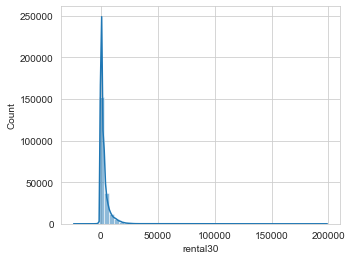

In [33]:
plt.figure(figsize=(5,4))
sns.histplot(x='rental30',data=df,kde=True,bins=50)
df['rental30'].min(),"and",df['rental30'].max()

- Average main account balance over last 30 days Lies (-23737.14, 'and', 198926.11)

(-24720.58, 'and', 200148.11)

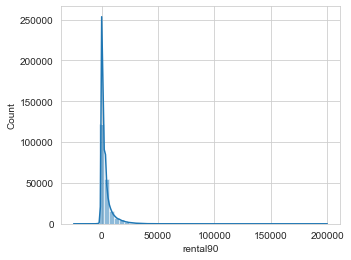

In [34]:
plt.figure(figsize=(5,4))
sns.histplot(x='rental90',data=df,kde=True,bins=50)
df['rental90'].min(),"and",df['rental90'].max()

- Average main account balance over last 90 days shows between (-24720.58, 'and', 200148.11)

(-29.0, 'and', 998650.377732702)

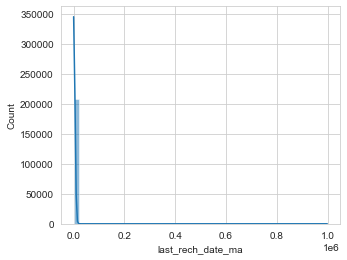

In [35]:
plt.figure(figsize=(5,4))
sns.histplot(x='last_rech_date_ma',data=df,kde=True,bins=50)
df['last_rech_date_ma'].min(),"and",df['last_rech_date_ma'].max()

- Number of days till last recharge of main account lies between -29.0, 'and', 998650.377732702

(173.0, 'and', 55000.0)

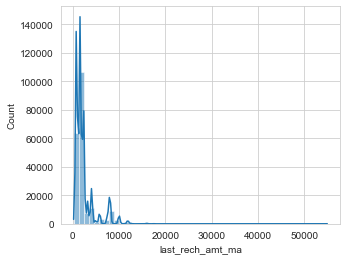

In [36]:
plt.figure(figsize=(5,4))
sns.histplot(x='last_rech_amt_ma',data=df,kde=True,bins=50)
df['last_rech_amt_ma'].min(),"and",df['last_rech_amt_ma'].max()

- Number of days till last recharge of data account lies between 0 to 55000

(1.0, 'and', 203.0)

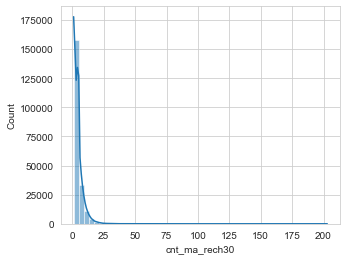

In [37]:
plt.figure(figsize=(5,4))
sns.histplot(x='cnt_ma_rech30',data=df,kde=True,bins=50)
df['cnt_ma_rech30'].min(),"and",df['cnt_ma_rech30'].max()

- Number of times main account got recharged in last 30 days lies between (0, 'and', 203)

(1.0, 'and', 999606.368131936)

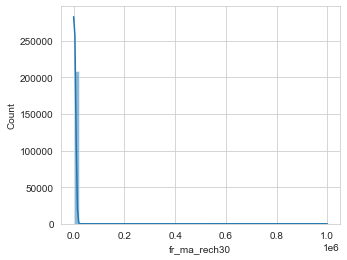

In [38]:
plt.figure(figsize=(5,4))
sns.histplot(x='fr_ma_rech30',data=df,kde=True,bins=50)
df['fr_ma_rech30'].min(),"and",df['fr_ma_rech30'].max()

Frequency of main account recharged in last 30 days lies between (0.0, 'and', 999606.368131936)

173.0 and 810096.0


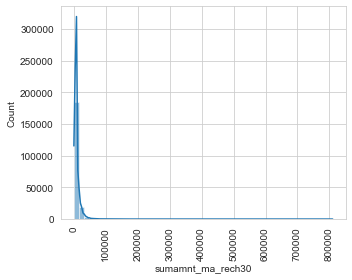

In [39]:
plt.figure(figsize=(5,4))
sns.histplot(x='sumamnt_ma_rech30',data=df,kde=True,bins=50)
print(df['sumamnt_ma_rech30'].min(),"and",df['sumamnt_ma_rech30'].max())
plt.xticks(rotation=90,fontsize=10)
plt.tight_layout()

- Total amount of recharge in main account over last 30 days (in Indonesian Rupiah) lies between 0.0 and 810096.0

(173.0, 'and', 55000.0)

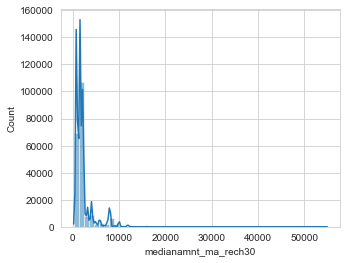

In [40]:
plt.figure(figsize=(5,4))
sns.histplot(x='medianamnt_ma_rech30',data=df,kde=True,bins=50)
df['medianamnt_ma_rech30'].min(),"and",df['medianamnt_ma_rech30'].max()

- Median of amount of recharges done in main account over last 30 days at user level (in Indonesian Rupiah)lies between (0.0, 'and', 55000.0)

(-200.0, 'and', 999479.419318959)

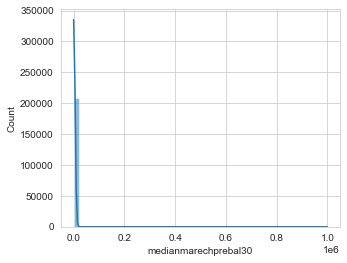

In [41]:
plt.figure(figsize=(5,4))
sns.histplot(x='medianmarechprebal30',data=df,kde=True,bins=50)
df['medianmarechprebal30'].min(),"and",df['medianmarechprebal30'].max()

- Median of main account balance just before recharge in last 30 days at user level (in Indonesian Rupiah) lies between -200 'and', 999479.419318959 

(-200.0, 'and', 999479.419318959)

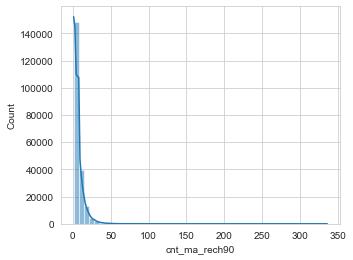

In [42]:
plt.figure(figsize=(5,4))
sns.histplot(x='cnt_ma_rech90',data=df,kde=True,bins=50)
df['medianmarechprebal30'].min(),"and",df['medianmarechprebal30'].max()

- Number of times main account got recharged in last 90 days

(-200.0, 'and', 999479.419318959)

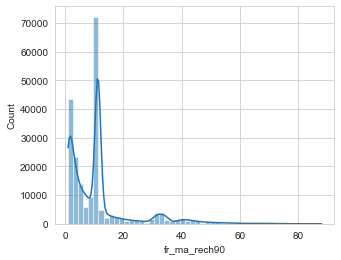

In [43]:
plt.figure(figsize=(5,4))
sns.histplot(x='fr_ma_rech90',data=df,kde=True,bins=50)
df['medianmarechprebal30'].min(),"and",df['medianmarechprebal30'].max()

- Frequency of main account recharged in last 90 days

(-200.0, 'and', 999479.419318959)

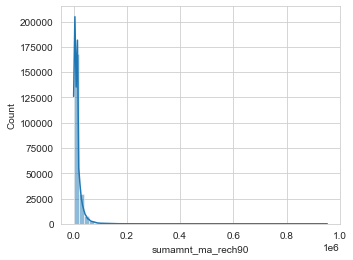

In [44]:
plt.figure(figsize=(5,4))
sns.histplot(x='sumamnt_ma_rech90',data=df,kde=True,bins=50)
df['medianmarechprebal30'].min(),"and",df['medianmarechprebal30'].max()

- Total amount of recharge in main account over last 90 days (in Indonasian Rupiah)

(-200.0, 'and', 999479.419318959)

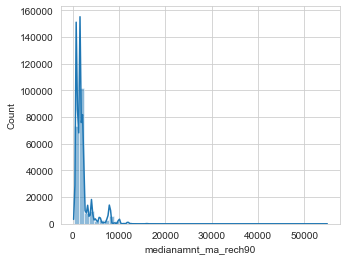

In [45]:
plt.figure(figsize=(5,4))
sns.histplot(x='medianamnt_ma_rech90',data=df,kde=True,bins=50)
df['medianmarechprebal30'].min(),"and",df['medianmarechprebal30'].max()

- Median of main account balance just before recharge in last 90 days at user level (in Indonasian Rupiah)

(-200.0, 'and', 999479.419318959)

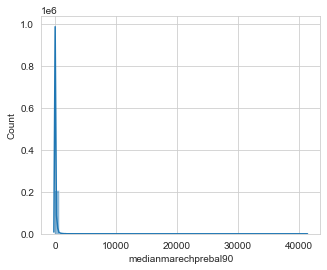

In [46]:
plt.figure(figsize=(5,4))
sns.histplot(x='medianmarechprebal90',data=df,kde=True,bins=50)
df['medianmarechprebal30'].min(),"and",df['medianmarechprebal30'].max()

- Median of main account balance just before recharge in last 90 days at user level (in Indonasian Rupiah)

(-200.0, 'and', 999479.419318959)

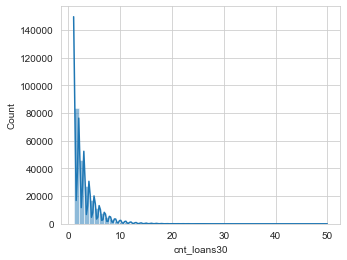

In [47]:
plt.figure(figsize=(5,4))
sns.histplot(x='cnt_loans30',data=df,kde=True,bins=50)
df['medianmarechprebal30'].min(),"and",df['medianmarechprebal30'].max()

- Number of loans taken by user in last 30 days

(-200.0, 'and', 999479.419318959)

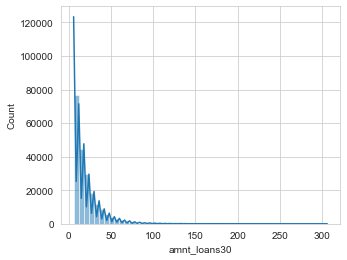

In [48]:
plt.figure(figsize=(5,4))
sns.histplot(x='amnt_loans30',data=df,kde=True,bins=50)
df['medianmarechprebal30'].min(),"and",df['medianmarechprebal30'].max()

- Total amount of loans taken by user in last 30 days

(-200.0, 'and', 999479.419318959)

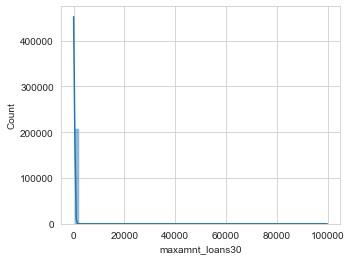

In [49]:
plt.figure(figsize=(5,4))
sns.histplot(x='maxamnt_loans30',data=df,kde=True,bins=50)
df['medianmarechprebal30'].min(),"and",df['medianmarechprebal30'].max()

- Maximum amount of loan taken by the user in last 30 days

(-200.0, 'and', 999479.419318959)

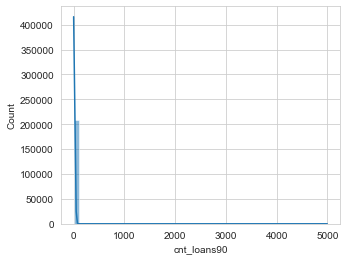

In [50]:
plt.figure(figsize=(5,4))
sns.histplot(x='cnt_loans90',data=df,kde=True,bins=50)
df['medianmarechprebal30'].min(),"and",df['medianmarechprebal30'].max()

- Number of loans taken by user in last 90 days

(-200.0, 'and', 999479.419318959)

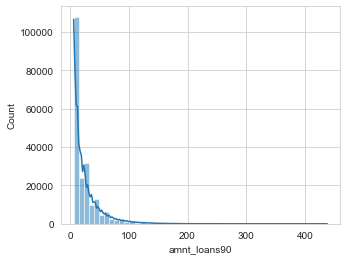

In [51]:
plt.figure(figsize=(5,4))
sns.histplot(x='amnt_loans90',data=df,kde=True,bins=50)
df['medianmarechprebal30'].min(),"and",df['medianmarechprebal30'].max()

- Total amount of loans taken by user in last 90 days

6.00000     180944
12.00000     26605
6.76912       2043
Name: maxamnt_loans90, dtype: int64

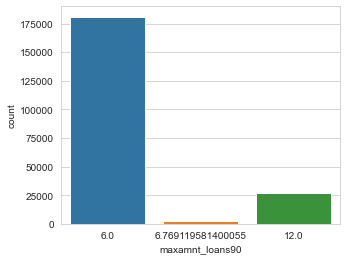

In [52]:
plt.figure(figsize=(5,4))
sns.countplot(x='maxamnt_loans90',data=df)
df['maxamnt_loans90'].value_counts()

- Maximum amount of loan taken by the user in last 90 days 6.00000->180944, 12.00000 -> 26605, 6.76912-> 2043

<AxesSubplot:xlabel='payback30', ylabel='Count'>

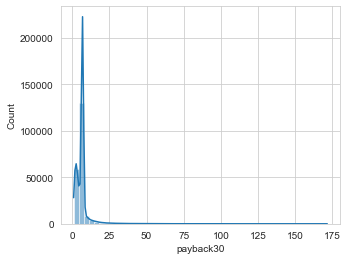

In [53]:
plt.figure(figsize=(5,4))
sns.histplot(x='payback30',data=df,kde=True,bins=50)

- Average payback time in days over last 30 days

<AxesSubplot:xlabel='payback90', ylabel='Count'>

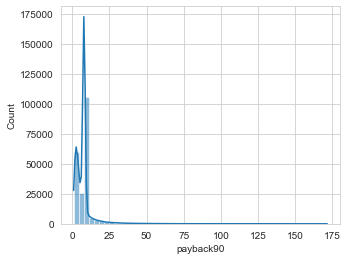

In [54]:
plt.figure(figsize=(5,4))
sns.histplot(x='payback90',data=df,kde=True,bins=50)

- Average payback time in days over last 90 days

2016    209592
Name: year, dtype: int64

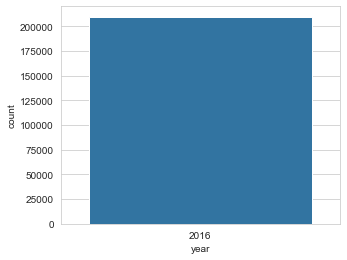

In [55]:
plt.figure(figsize=(5,4))
sns.countplot(x='year',data=df)
df['year'].value_counts()

All observation where taken in 2016

7    85764
6    83154
8    40674
Name: Month, dtype: int64

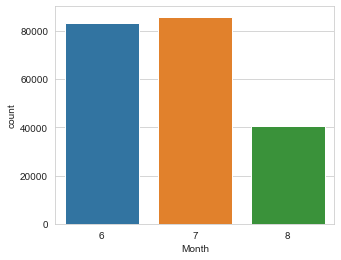

In [56]:
plt.figure(figsize=(5,4))
sns.countplot(x='Month',data=df)
df['Month'].value_counts()

- High observation 7th Month

11    8092
10    8050
6     8030
12    8028
7     8026
Name: Day, dtype: int64

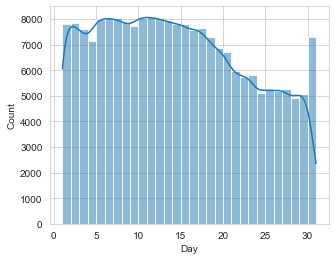

In [57]:
plt.figure(figsize=(5,4))
sns.histplot(x='Day',data=df,kde=True,bins=30)
df['Day'].value_counts()[:5]

- High Observation in the 11th and 12th of the Month

## Bi-variate Analysis

In [58]:
numerical=['aon', 'daily_decr30', 'daily_decr90', 'rental30', 'rental90',
       'last_rech_date_ma', 'last_rech_amt_ma', 'cnt_ma_rech30',
       'fr_ma_rech30', 'sumamnt_ma_rech30', 'medianamnt_ma_rech30',
       'medianmarechprebal30', 'cnt_ma_rech90', 'fr_ma_rech90',
       'sumamnt_ma_rech90', 'medianamnt_ma_rech90', 'medianmarechprebal90',
       'cnt_loans30', 'amnt_loans30', 'maxamnt_loans30', 'cnt_loans90',
       'amnt_loans90', 'maxamnt_loans90', 'payback30', 'payback90','year', 'Month', 'Day']

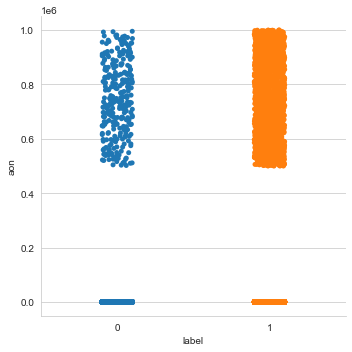

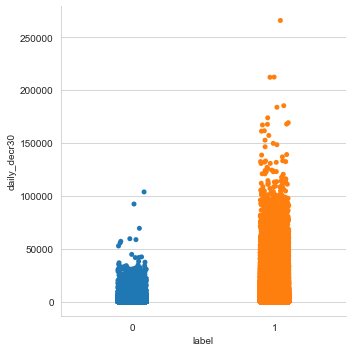

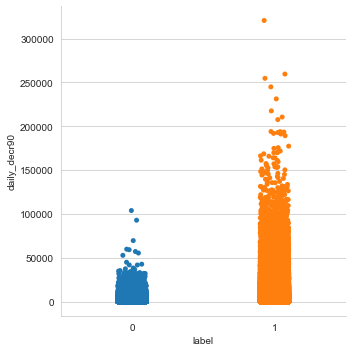

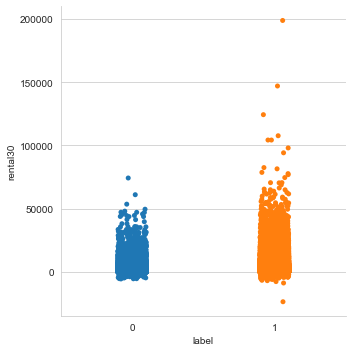

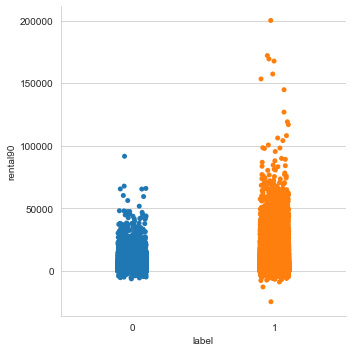

...

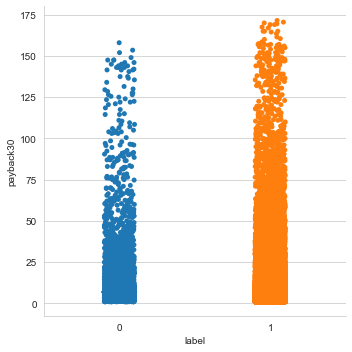

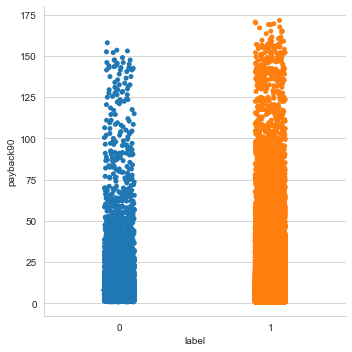

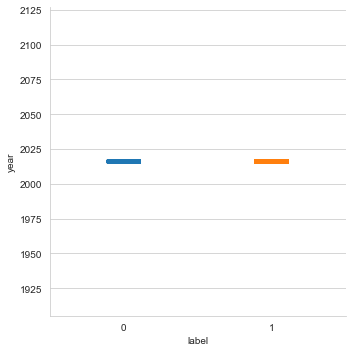

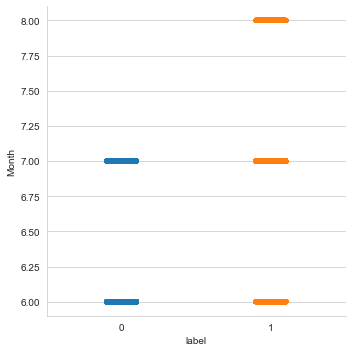

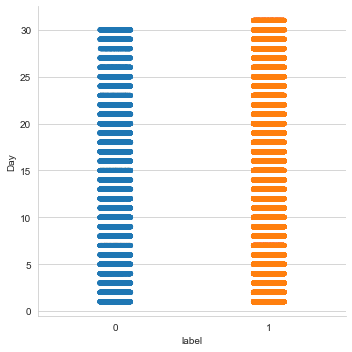

In [59]:
for i in numerical:
    sns.catplot(y=i,data=df,x='label')
    plt.show()

# Observations:

- 
-
-

## Descriptive Statistics

In [60]:
df.describe()

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90,year,Month,Day
count,209592.000000,209592.000000,209592.000000,209592.000000,209592.000000,209592.000000,209592.000000,209592.000000,209592.000000,209592.000000,209592.000000,209592.000000,209592.000000,209592.000000,209592.000000,209592.000000,209592.000000,209592.000000,209592.000000,209592.000000,209592.000000,209592.000000,209592.000000,209592.00000,209592.000000,209592.000000,209592.0,209592.000000,209592.000000
mean,0.875177,8112.380399,5489.959081,6202.771599,2793.417675,3602.308657,4168.406542,2294.278727,4.590905,5983.725113,8891.438636,2092.099211,4512.481204,7.016810,11.244391,13772.923988,2071.673821,103.585981,2.802552,18.235542,278.977963,18.702668,23.878149,6.76912,6.923867,7.952291,2016.0,6.797321,14.398899
std,0.330519,75696.261220,9188.914158,10885.293648,4276.971957,5734.474546,53891.646466,2268.521440,3.959345,53565.443048,9678.201275,1944.791476,53982.941469,6.878717,11.458323,16343.826820,1986.780943,367.773015,2.530864,17.232713,4245.135051,224.790472,26.365761,1.99599,8.105169,9.516295,0.0,0.741437,8.438899
min,0.000000,-48.000000,-93.012667,-93.012667,-23737.140000,-24720.580000,-29.000000,173.000000,1.000000,1.000000,173.000000,173.000000,-200.000000,1.000000,1.000000,173.000000,173.000000,-200.000000,1.000000,6.000000,6.000000,1.000000,6.000000,6.00000,1.000000,1.000000,2016.0,6.000000,1.000000
25%,1.000000,246.000000,49.958250,50.030500,352.577500,391.500000,2.000000,773.000000,2.000000,3.000000,3086.000000,773.000000,23.200000,3.000000,3.000000,4029.000000,773.000000,23.000000,1.000000,6.000000,6.000000,1.000000,6.000000,6.00000,4.000000,3.880515,2016.0,6.000000,7.000000
50%,1.000000,527.000000,1743.494500,1780.950000,1270.790000,1557.975000,4.000000,1539.000000,4.000000,10.000000,7226.000000,1539.000000,58.200000,6.000000,11.244391,10000.000000,1539.000000,52.150000,2.000000,12.000000,6.000000,2.000000,12.000000,6.00000,6.923867,7.952291,2016.0,7.000000,14.000000
75%,1.000000,982.000000,7244.096000,7802.795000,3356.945000,4201.792500,11.000000,2309.000000,5.000000,5983.725113,10010.000000,2092.099211,229.500000,8.000000,11.244391,16000.000000,2071.673821,103.585981,4.000000,24.000000,6.000000,5.000000,30.000000,6.00000,6.923867,7.952291,2016.0,7.000000,21.000000
max,1.000000,999860.755168,265926.000000,320630.000000,198926.110000,200148.110000,998650.377733,55000.000000,203.000000,999606.368132,810096.000000,55000.000000,999479.419319,336.000000,88.000000,953036.000000,55000.000000,41456.500000,50.000000,306.000000,99864.560864,4997.517944,438.000000,12.00000,171.500000,171.500000,2016.0,8.000000,31.000000


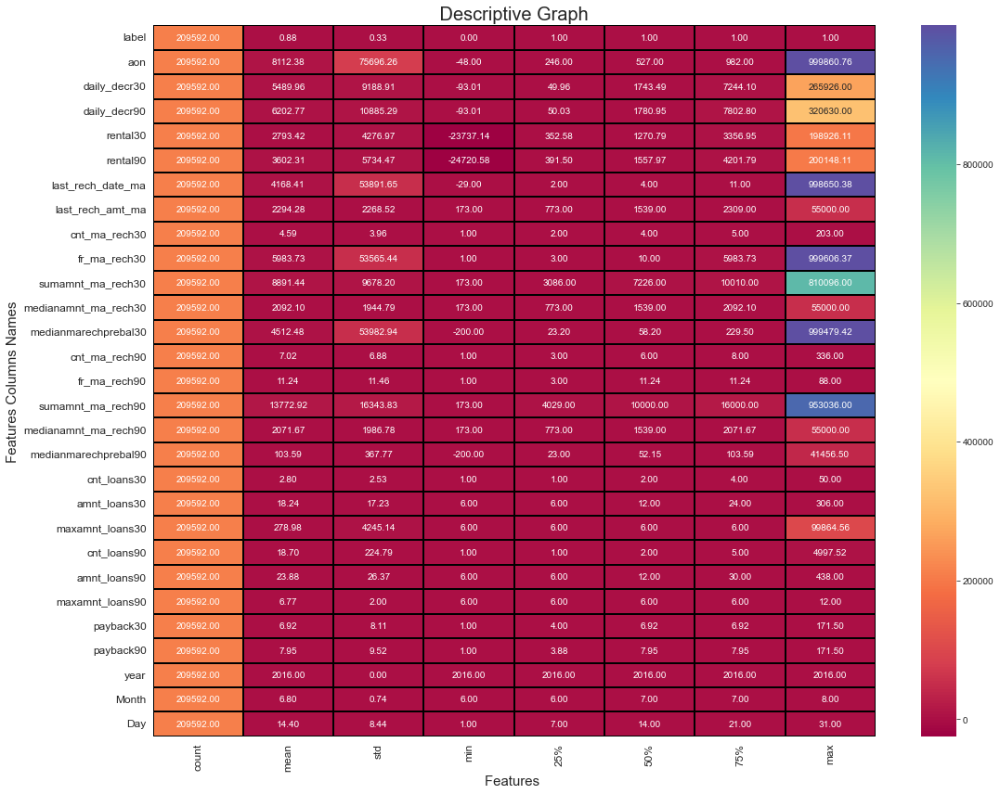

In [61]:
plt.figure(figsize=(16,12))
sns.heatmap(df.describe().T,annot=True,linewidth=0.02,linecolor='black',fmt='0.02f',cmap='Spectral')
plt.xlabel("Features ", fontsize=15)
plt.ylabel(" Features Columns Names ", fontsize=15)
plt.title(" Descriptive Graph ",fontsize=20)
plt.yticks(rotation=0,fontsize=12)
plt.xticks(rotation=90,fontsize=12)
plt.tight_layout()

    # Few Observations:

    1. Null Values- All values are intact(No Null Values)

    2. Right Skew- aon, daily_decr30, daily_decr90, rental30, rental90, last_rech_date_ma, last_rech_amt_ma, cnt_ma_rech30	fr_ma_rech30	sumamnt_ma_rech30	medianamnt_ma_rech30	medianmarechprebal30	cnt_ma_rech90	fr_ma_rech90	sumamnt_ma_rech90	medianamnt_ma_rech90	medianmarechprebal90	cnt_loans30	amnt_loans30	maxamnt_loans30	cnt_loans90	amnt_loans90	maxamnt_loans90	payback30	payback90	year	Month	Day

    3. Left Skew- Null
    4. Standard Deviation-aon	daily_decr30	daily_decr90	rental30	rental90	last_rech_date_ma	last_rech_amt_ma	cnt_ma_rech30	fr_ma_rech30	sumamnt_ma_rech30	medianamnt_ma_rech30	medianmarechprebal30

    5. Outliers- aon,cnt_ma_rech30	fr_ma_rech30	sumamnt_ma_rech30	medianamnt_ma_rech30	medianmarechprebal30	cnt_ma_rech90	fr_ma_rech90	sumamnt_ma_rech90	medianamnt_ma_rech90	medianmarechprebal90	cnt_loans30	amnt_loans30	maxamnt_loans30	cnt_loans90	amnt_loans90	maxamnt_loans90	payback30	payback90	year	Month	Day

# Correlation Graph 

In [62]:
df.corr()

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90,year,Month,Day
label,1.000000,-0.003785,0.142198,0.141131,0.032967,0.050690,-0.003482,0.041839,0.127398,-0.014386,0.111302,0.032169,-0.014264,0.150996,-0.043094,0.132782,0.028278,0.011521,0.204619,0.205169,0.000632,0.005039,0.203912,0.101177,-0.059613,-0.064967,NaN,0.154948,0.006824
aon,-0.003785,1.000000,0.001103,0.000343,-0.000813,-0.000697,0.001662,0.003981,-0.003631,-0.001149,0.000545,0.004356,0.003887,-0.003258,0.003515,0.000706,0.004726,-0.001071,-0.001431,-0.001347,-0.002739,-0.000592,-0.002125,-0.000493,0.002621,0.002024,NaN,-0.001863,0.000663
daily_decr30,0.142198,0.001103,1.000000,0.977506,0.433198,0.450247,-0.002995,0.234655,0.408826,-0.013225,0.607298,0.243486,-0.006148,0.560393,-0.187066,0.743427,0.214967,0.021845,0.367830,0.473968,0.000058,0.009131,0.562628,0.429431,-0.094962,-0.082825,NaN,0.511512,0.005511
daily_decr90,0.141131,0.000343,0.977506,1.000000,0.426145,0.463312,-0.002434,0.224343,0.385695,-0.012442,0.575638,0.233508,-0.005502,0.568419,-0.185713,0.751031,0.209310,0.021300,0.342989,0.451198,0.000181,0.009654,0.566873,0.427412,-0.097563,-0.086213,NaN,0.532285,-0.022528
rental30,0.032967,-0.000813,0.433198,0.426145,1.000000,0.954566,-0.002947,0.097322,0.199172,-0.007798,0.245399,0.091057,-0.003327,0.284651,-0.099887,0.319820,0.078790,0.017980,0.174264,0.228829,-0.000354,0.004145,0.291422,0.261886,0.005515,0.019475,NaN,0.373104,0.036765
rental90,0.050690,-0.000697,0.450247,0.463312,0.954566,1.000000,-0.003727,0.087496,0.195145,-0.007360,0.231111,0.080158,-0.003530,0.318949,-0.107929,0.337738,0.067576,0.018876,0.169531,0.230902,-0.000665,0.005356,0.322307,0.283060,-0.001136,0.019204,NaN,0.433834,0.009710
last_rech_date_ma,-0.003482,0.001662,-0.002995,-0.002434,-0.002947,-0.003727,1.000000,-0.000084,0.005109,-0.001143,0.002585,-0.000991,0.004697,0.004584,0.001409,0.002420,-0.000614,-0.001146,-0.003952,-0.004140,0.000935,-0.000233,-0.003957,-0.002464,-0.001902,-0.001182,NaN,-0.004686,-0.001039
last_rech_amt_ma,0.041839,0.003981,0.234655,0.224343,0.097322,0.087496,-0.000084,1.000000,-0.089410,0.005197,0.414193,0.804387,-0.000547,-0.074519,0.047317,0.374738,0.802020,0.105538,-0.093344,-0.054033,0.001518,-0.000056,-0.048677,0.148136,-0.038032,-0.038780,NaN,0.055799,0.010055
cnt_ma_rech30,0.127398,-0.003631,0.408826,0.385695,0.199172,0.195145,0.005109,-0.089410,1.000000,-0.010884,0.616679,-0.157781,0.000811,0.863382,-0.323759,0.541245,-0.144814,-0.002819,0.719111,0.706363,-0.000411,0.014802,0.637845,0.146612,-0.181421,-0.190651,NaN,0.114380,0.041630
fr_ma_rech30,-0.014386,-0.001149,-0.013225,-0.012442,-0.007798,-0.007360,-0.001143,0.005197,-0.010884,1.000000,-0.010899,0.000872,0.003469,-0.012429,0.007686,-0.012527,0.001444,0.000271,-0.015965,-0.015891,-0.001047,0.003117,-0.015034,-0.009022,0.001016,0.002059,NaN,-0.009753,-0.003557


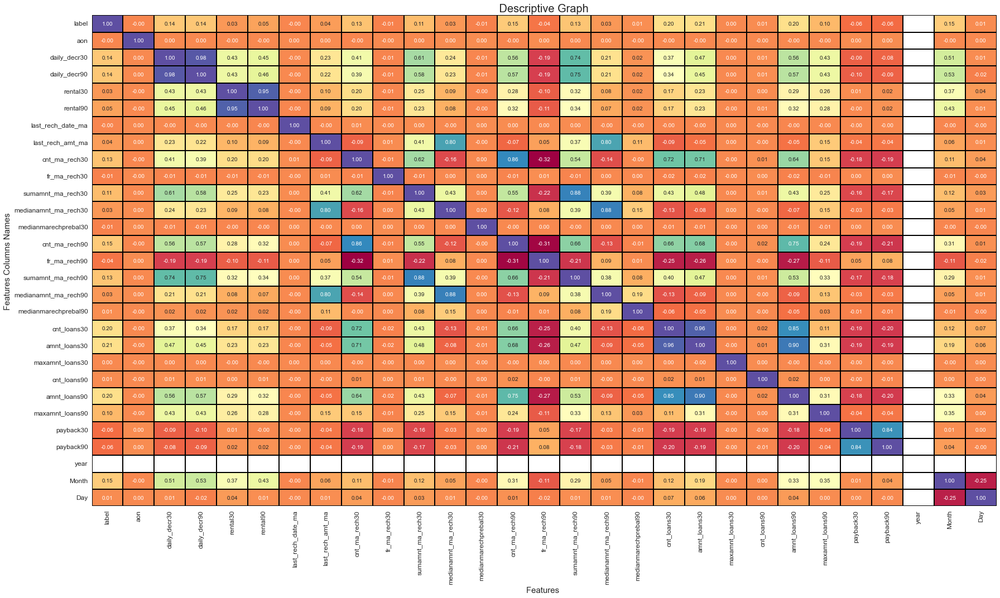

In [63]:
plt.figure(figsize=(25,15))
sns.heatmap(df.corr(),annot=True,linewidth=0.02,linecolor='black',fmt='0.02f',cmap='Spectral',cbar=False)
plt.xlabel("Features ", fontsize=15)
plt.ylabel(" Features Columns Names ", fontsize=15)
plt.title(" Descriptive Graph ",fontsize=20)
plt.yticks(rotation=0,fontsize=12)
plt.xticks(rotation=90,fontsize=12)
plt.tight_layout()

In [64]:
df.corr()['label'].sort_values()

payback90              -0.064967
payback30              -0.059613
fr_ma_rech90           -0.043094
fr_ma_rech30           -0.014386
medianmarechprebal30   -0.014264
aon                    -0.003785
last_rech_date_ma      -0.003482
maxamnt_loans30         0.000632
cnt_loans90             0.005039
Day                     0.006824
medianmarechprebal90    0.011521
medianamnt_ma_rech90    0.028278
medianamnt_ma_rech30    0.032169
rental30                0.032967
last_rech_amt_ma        0.041839
rental90                0.050690
maxamnt_loans90         0.101177
sumamnt_ma_rech30       0.111302
cnt_ma_rech30           0.127398
sumamnt_ma_rech90       0.132782
daily_decr90            0.141131
daily_decr30            0.142198
cnt_ma_rech90           0.150996
Month                   0.154948
amnt_loans90            0.203912
cnt_loans30             0.204619
amnt_loans30            0.205169
label                   1.000000
year                         NaN
Name: label, dtype: float64

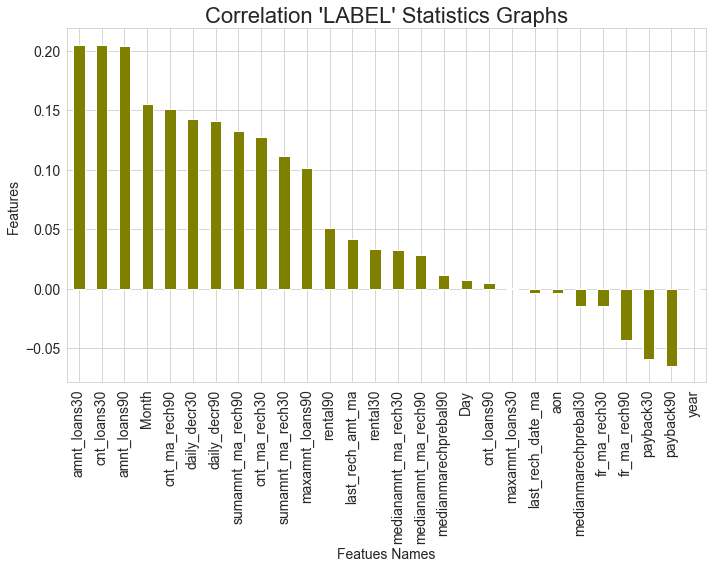

In [65]:
plt.figure(figsize=(10,8))
df.corr()['label'].sort_values(ascending=False).drop(['label']).plot(kind='bar',color='olive')
plt.title("Correlation 'LABEL' Statistics Graphs",fontsize=22)
plt.xlabel("Featues Names",fontsize=14)
plt.ylabel('Features',fontsize=14)
plt.xticks(rotation=90,fontsize=14)
plt.yticks(rotation=0,fontsize=14)
plt.tight_layout()

## Observation Shows:

- payback90 is 6 percent negatively correlated with the target variable which is extreamly weak.           
- payback30 is 6 percent negatively correlated with the target variable which is extreamly weak.            

- fr_ma_rech90 is 4 percentage negatively correlated with the target variable.        
- fr_ma_rech30 is 1 percentage negatively correlated with the target variable.        

- medianmarechprebal30 is 1 percentage negatively correlated with the target variable.  
- aon is 0 percentage negatively correlated with the target variable.

- last_rech_date_ma is 0 percentage negatively correlated with the target variable. 
- maxamnt_loans30 is 0 percentage negatively correlated with the target variable.
- cnt_loans90 is 1 percentage positively correlated with the target variable.          
- Day is 1 percentage positively correlated with the target variable.        

- medianmarechprebal90 is 1 percentage positively correlated with the target variable. 

- medianamnt_ma_rech90 is 3 percentage positively correlated with the target variable.  
- medianamnt_ma_rech30 is 3 percentage positively correlated with the target variable.

- rental30 is 3 percentage positively correlated with the target variable.
- last_rech_amt_ma  is 4 percentage positively correlated with the target variable. 
- rental90 is 5 percentage positively correlated with the target variable. 
- maxamnt_loans90 is 10 percentage positively correlated with the target variable. 
- sumamnt_ma_rech30 is 11 percentage positively correlated with the target variable.

- cnt_ma_rech30  is 13 percentage positively correlated with the target variable
- sumamnt_ma_rech90 is 13 percentage positively correlated with the target variable.
- daily_decr90 is 14 percentage positively correlated with the target variable.  
- daily_decr30  is 14 percentage positively correlated with the target variable.

- cnt_ma_rech90 is 15 percentage positively correlated with the target variable.
- Month  is 15 percentage positively correlated with the target variable.             
- amnt_loans90 is 20 percentage positively correlated with the target variable.         
- cnt_loans30  is 20 percentage positively correlated with the target variable.       
- amnt_loans30 is 21 percentage positively correlated with the target variable which is very strongly correlated..
- label is 100 percentage positively correlated with the target variable.               
- year  is No correlation with the target variable.

#### NOTE

- Payback is very negatively correlated with target variable.
- Amnt Loan is 21 percent positively correlated with target variable.
- Label is 100 percentage correlated with target variable.
- Year is No correlation with the target Variable.

# Feature Engneering

In [66]:
df['Avg_Payback']=(df['payback90']+df['payback30'])/2
df['Avg_Freq_Recharge']=(df['fr_ma_rech90']+df['fr_ma_rech30'])/2
df['Avg_Median_Recharge']=(df['medianamnt_ma_rech90']+df['medianamnt_ma_rech30'])/2
df['Avg_Rental']=(df['rental30']+df['rental90'])/2
df['Avg_Amount_Loan']=(df['maxamnt_loans30']+df['maxamnt_loans90'])/2
df['Avg_Median_Recharge']=(df['medianmarechprebal90']+df['medianmarechprebal30'])/2
df['Avg_Amount_Recharge']=(df['sumamnt_ma_rech90']+df['sumamnt_ma_rech30'])/2
df['Avg_Amount_Spent']=(df['daily_decr90']+df['daily_decr30'])/2

In [67]:
df.drop(['payback90','payback30','fr_ma_rech90','fr_ma_rech30','medianamnt_ma_rech90','medianamnt_ma_rech30',
        'rental30','rental90','maxamnt_loans30','maxamnt_loans90','medianmarechprebal90','medianmarechprebal30',
        'sumamnt_ma_rech90','sumamnt_ma_rech30','daily_decr90','daily_decr30' ],axis=1,inplace=True)

# Outliers

 Column  aon
**************************************************


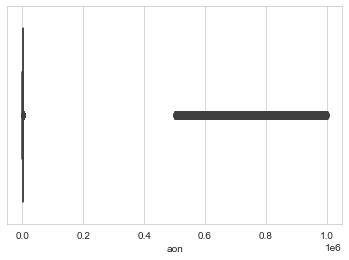

 Column  last_rech_date_ma
**************************************************


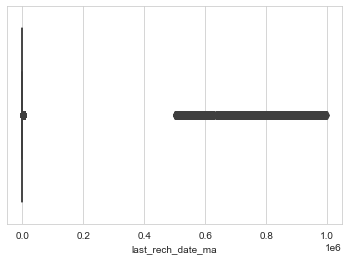

 Column  last_rech_amt_ma
**************************************************


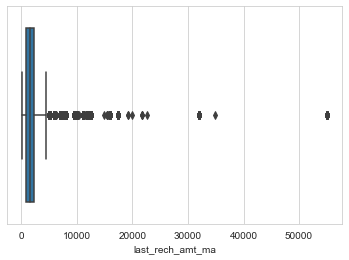

 Column  cnt_ma_rech30
**************************************************


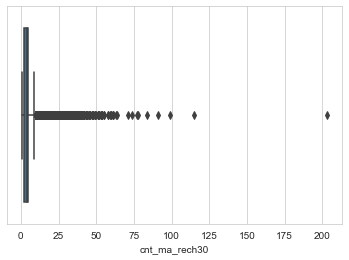

 Column  cnt_ma_rech90
**************************************************


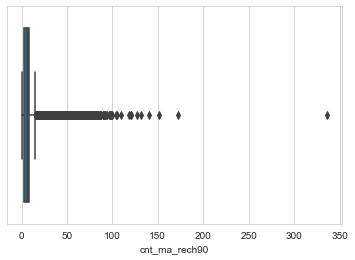

 Column  cnt_loans30
**************************************************


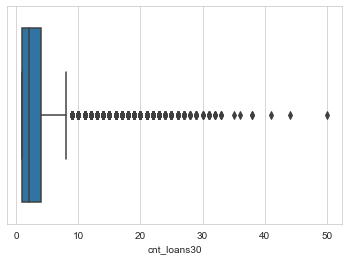

 Column  amnt_loans30
**************************************************


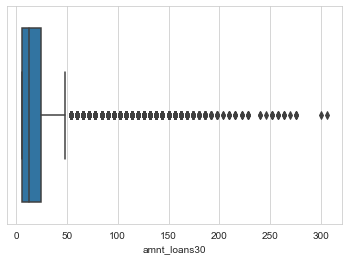

 Column  cnt_loans90
**************************************************


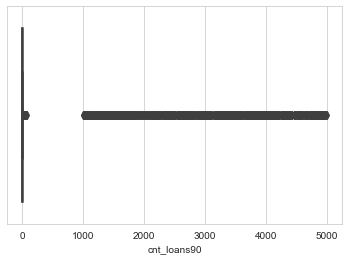

 Column  amnt_loans90
**************************************************


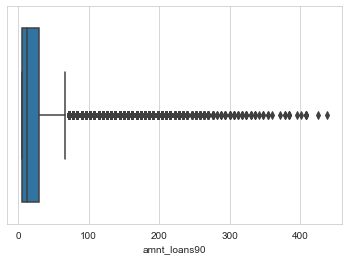

 Column  Avg_Payback
**************************************************


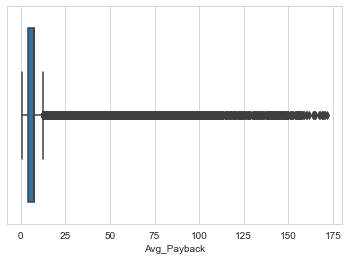

 Column  Avg_Freq_Recharge
**************************************************


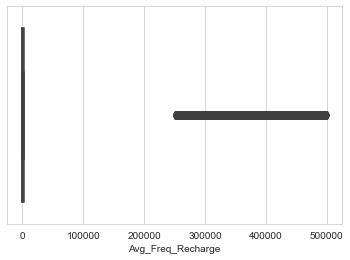

 Column  Avg_Median_Recharge
**************************************************


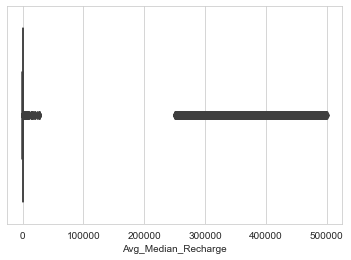

 Column  Avg_Rental
**************************************************


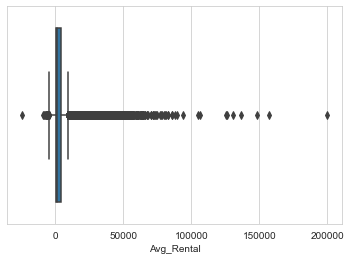

 Column  Avg_Amount_Loan
**************************************************


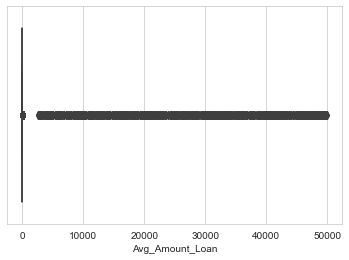

 Column  Avg_Amount_Recharge
**************************************************


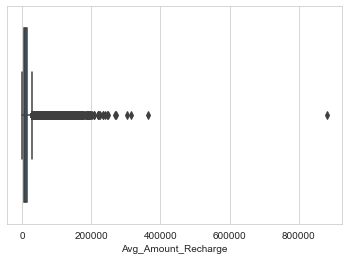

 Column  Avg_Amount_Spent
**************************************************


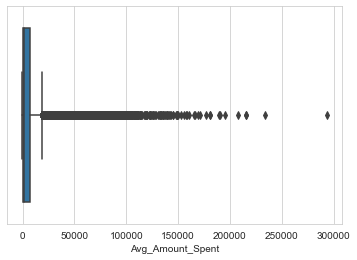

In [68]:
for i in df.columns:
    if df[i].dtype=='float64':
        print(" Column ", i)
        sns.boxplot(x=i,data=df)
        print("*****"*10)
        plt.show()

## Observations Shows:

- Float Values shows extream Outliers

Column  label
****************************************


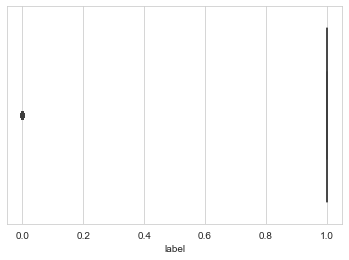

Column  year
****************************************


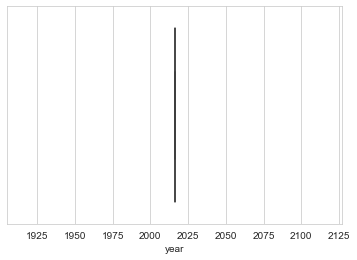

Column  Month
****************************************


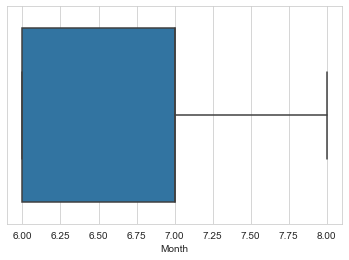

Column  Day
****************************************


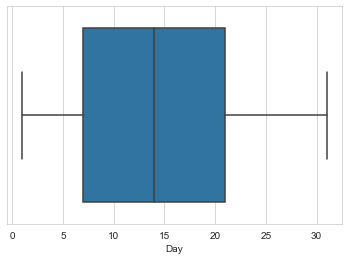

In [69]:
for i in df.columns:
    if df[i].dtype=='int64':
        print("Column ",i)
        sns.boxplot(x=i,data=df)
        print("**"*20)
        plt.show()

- Label Shows Outliers, Its a Target Variable

# Skewness

In [70]:
df.skew().sort_values()

label                  -2.270245
year                    0.000000
Day                     0.199856
Month                   0.343245
cnt_loans30             2.758665
amnt_loans30            3.020769
amnt_loans90            3.168028
cnt_ma_rech90           3.687818
cnt_ma_rech30           3.746757
Avg_Amount_Spent        4.066399
last_rech_amt_ma        4.086556
Avg_Rental              4.447820
Avg_Amount_Recharge     5.749919
Avg_Payback             8.462428
aon                    10.392923
Avg_Freq_Recharge      14.711856
Avg_Median_Recharge    14.760024
last_rech_date_ma      14.779844
cnt_loans90            16.593606
Avg_Amount_Loan        17.656686
dtype: float64

### Normal Skewness Lies between +/-65

- cnt_loans30             2.758665
- amnt_loans30            3.020769
- amnt_loans90            3.168028
- cnt_ma_rech90           3.687818
- cnt_ma_rech30           3.746757
- Avg_Amount_Spent        4.066399
- last_rech_amt_ma        4.086556
- Avg_Rental              4.447820
- Avg_Amount_Recharge     5.749919
-  Avg_Payback             8.462428
- aon                    10.392923
- Avg_Freq_Recharge      14.711856
- Avg_Median_Recharge    14.760024
- last_rech_date_ma      14.779844
- cnt_loans90            16.593606
- Avg_Amount_Loan        17.656686

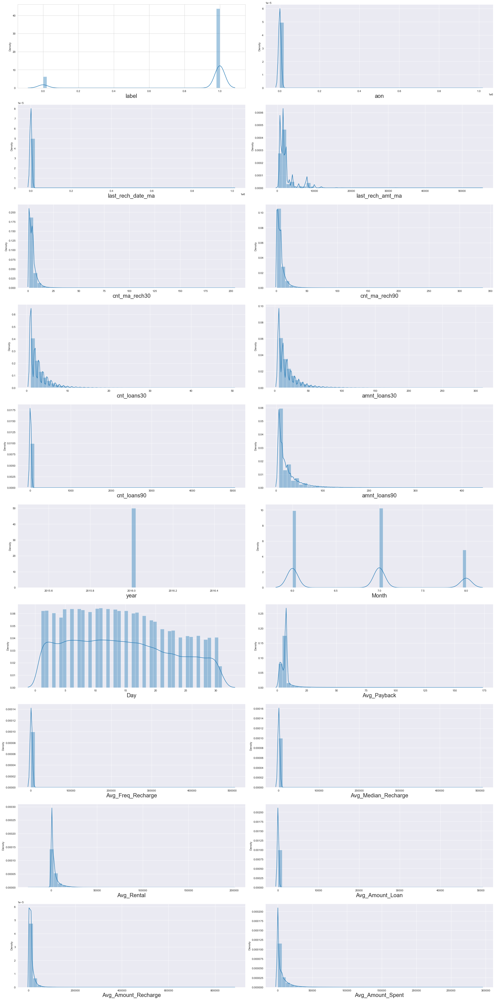

In [71]:
plt.figure(figsize=(25,100),facecolor='white',edgecolor='black')
plotnumb=1

for i in df:
    if plotnumb<=40:
        ax=plt.subplot(20,2,plotnumb)
        sns.set_style("darkgrid")
        sns.distplot(df[i])
        plt.xlabel(i,fontsize=20)
        
    plotnumb+=1
plt.tight_layout()

# Observation Shows

- Maximum Graph lies beyond the normal Graph,
- Graph contains models that are Bi-Model,Tri-Modal and Multi-Modal Graph.
- Graph Shows Right and Left Skewness

# Data Cleansing:

In [72]:
print(round(df.corr()['label'].sort_values(),2))

Avg_Payback           -0.07
Avg_Freq_Recharge     -0.01
Avg_Median_Recharge   -0.01
aon                   -0.00
last_rech_date_ma     -0.00
Avg_Amount_Loan        0.00
cnt_loans90            0.01
Day                    0.01
last_rech_amt_ma       0.04
Avg_Rental             0.04
cnt_ma_rech30          0.13
Avg_Amount_Recharge    0.13
Avg_Amount_Spent       0.14
cnt_ma_rech90          0.15
Month                  0.15
amnt_loans90           0.20
cnt_loans30            0.20
amnt_loans30           0.21
label                  1.00
year                    NaN
Name: label, dtype: float64


## Deleting Non Correlated Data

Highly Negative to target variable.
- Avg_Payback           -0.07

Shows No good Relation with Target Variable.
- aon                   -0.00
- last_rech_date_ma     -0.00
- Avg_Amount_Loan        0.00

In [73]:
delete=pd.DataFrame(data={'Columns':['Avg_Payback','aon','last_rech_date_ma','Avg_Amount_loan'],
                         'Values':[-0.07,-0.00,-0.00,0.00],
                         'Outliers':['Y','Y','Y','Y'],
                         'Normalised':['N','N','N','N']})

df.drop(['year','Avg_Amount_Loan','last_rech_date_ma','aon'],axis=1,inplace=True)
delete

,Columns,Values,Outliers,Normalised
0,Avg_Payback,-0.07,Y,N
1,aon,-0.00,Y,N
2,last_rech_date_ma,-0.00,Y,N
3,Avg_Amount_loan,0.00,Y,N


# Removing Outliers Zscore

In [74]:
from scipy.stats import zscore
z=np.abs(zscore(df))
z.head(3)

,label,last_rech_amt_ma,cnt_ma_rech30,cnt_ma_rech90,cnt_loans30,amnt_loans30,cnt_loans90,amnt_loans90,Month,Day,Avg_Payback,Avg_Freq_Recharge,Avg_Median_Recharge,Avg_Rental,Avg_Amount_Recharge,Avg_Amount_Spent
0,2.647889,0.33294,0.654379,0.729325,0.317107,0.361844,0.074303,0.450515,0.273361,0.663726,2.549454e+00,1.111346e-01,0.085229,0.597552,0.653374,0.279160
1,0.377659,1.53965,0.906946,0.874701,0.712230,0.361844,0.078752,0.450515,1.622097,0.521266,1.050171e-16,1.697914e-17,0.083246,0.099681,0.438938,0.628903
2,0.377659,0.33294,0.906946,0.874701,0.712230,0.710020,0.078752,0.678084,1.622097,0.545227,1.050171e-16,1.697914e-17,0.083050,0.464212,0.775196,0.445689


In [75]:
np.where(z>3)

(array([    36,     36,     49, ..., 209579, 209580, 209585], dtype=int64),
 array([ 7, 15, 14, ...,  1, 15,  7], dtype=int64))

In [76]:
z.iloc[36,7]

3.190579349853842

In [77]:
# replacing df with new df where z is less than 3
new_df=df[(z<3).all(axis=1)]

# Data Loss Percentage

In [78]:
print("Old DataFrame",df.shape[0])
print("New DataFrame",new_df.shape[0])
print("Total_Dropped_rows",df.shape[0]-new_df.shape[0])

Old DataFrame 209592
New DataFrame 184522
Total_Dropped_rows 25070


In [79]:
print('Data Loss Percentage ',((df.shape[0]-new_df.shape[0])/df.shape[0])*100)

Data Loss Percentage  11.961334402076416


- The Data Loss was very high, This loss would be more than 5 percent, so we will go with the old data set

### Dividing the Data for Train and Test

In [80]:
# Dividing the train and test data set
x=df.drop(['label'],axis=1)
y=df.iloc[:,0]

In [81]:
x.head(2)

,last_rech_amt_ma,cnt_ma_rech30,cnt_ma_rech90,cnt_loans30,amnt_loans30,cnt_loans90,amnt_loans90,Month,Day,Avg_Payback,Avg_Freq_Recharge,Avg_Median_Recharge,Avg_Rental,Avg_Amount_Recharge,Avg_Amount_Spent
0,1539.0,2.0,2.0,2.0,12.0,2.0,12.0,7,20,29.000000,21.000000,7.50,240.13,3078.0,3060.100
1,5787.0,1.0,1.0,1.0,12.0,1.0,12.0,8,10,7.438079,2997.484752,61.04,3691.26,5787.0,12123.375


In [82]:
y.head(2)

0    0
1    1
Name: label, dtype: int64

In [83]:
print("Present Size of X Data ",x.shape,"And present Size of Y Data ",y.shape)

Present Size of X Data  (209592, 15) And present Size of Y Data  (209592,)


In [84]:
x.columns

Index(['last_rech_amt_ma', 'cnt_ma_rech30', 'cnt_ma_rech90', 'cnt_loans30',
       'amnt_loans30', 'cnt_loans90', 'amnt_loans90', 'Month', 'Day',
       'Avg_Payback', 'Avg_Freq_Recharge', 'Avg_Median_Recharge', 'Avg_Rental',
       'Avg_Amount_Recharge', 'Avg_Amount_Spent'],
      dtype='object')

# Remove Skewness

In [85]:
from sklearn.preprocessing import power_transform

x=power_transform(x,method='yeo-johnson')

In [86]:
x=pd.DataFrame(data=x,columns=['last_rech_amt_ma', 'cnt_ma_rech30', 'cnt_ma_rech90',
       'cnt_loans30', 'amnt_loans30', 'cnt_loans90', 'amnt_loans90', 'Month',
       'Day', 'Avg_Payback', 'Avg_Freq_Recharge', 'Avg_Median_Recharge',
       'Avg_Rental', 'Avg_Amount_Recharge', 'Avg_Amount_Spent'])
x.skew()

last_rech_amt_ma      -0.019425
cnt_ma_rech30          0.021296
cnt_ma_rech90          0.015492
cnt_loans30            0.211269
amnt_loans30           0.138561
cnt_loans90            0.236660
amnt_loans90           0.127918
Month                  0.076433
Day                   -0.156076
Avg_Payback           -0.059695
Avg_Freq_Recharge      0.249575
Avg_Median_Recharge    2.034108
Avg_Rental            -0.289524
Avg_Amount_Recharge    0.001294
Avg_Amount_Spent      -5.734968
dtype: float64

In [87]:
# However the skewness is beyond the limit Hence droping the columns
x.drop(['Avg_Amount_Spent','Avg_Median_Recharge'],inplace=True,axis=1)
x.skew()

last_rech_amt_ma      -0.019425
cnt_ma_rech30          0.021296
cnt_ma_rech90          0.015492
cnt_loans30            0.211269
amnt_loans30           0.138561
cnt_loans90            0.236660
amnt_loans90           0.127918
Month                  0.076433
Day                   -0.156076
Avg_Payback           -0.059695
Avg_Freq_Recharge      0.249575
Avg_Rental            -0.289524
Avg_Amount_Recharge    0.001294
dtype: float64

# Standard Scaler

In [88]:
from sklearn.preprocessing import StandardScaler
ss=StandardScaler()

x=ss.fit_transform(x)
x

array([[-0.04677428, -0.74344497, -1.00793561, ..., -0.20129893,
        -0.61889505, -0.8998962 ],
       [ 1.58474362, -1.5518842 , -1.6401952 , ...,  1.20974535,
         0.2034858 , -0.29220748],
       [-0.04677428, -1.5518842 , -1.6401952 , ...,  1.20974535,
        -0.4327811 , -1.51750388],
       ...,
       [-0.04677428,  0.48553806,  0.9435031 , ..., -0.66068136,
         0.93076555,  0.63387174],
       [-1.17246084,  0.48553806,  0.22160343, ..., -0.85232121,
        -0.4862682 ,  0.71698195],
       [ 1.84123493, -0.74344497, -0.57693405, ..., -0.48928689,
        -0.52492552,  0.54054409]])

In [89]:
print(" Mean Value ",round(x.mean(),2)," Standard Deviation ",round(x.std(),2))

 Mean Value  0.0  Standard Deviation  1.0


In [90]:
x=pd.DataFrame(data=x,columns=['last_rech_amt_ma', 'cnt_ma_rech30', 'cnt_ma_rech90',
       'cnt_loans30', 'amnt_loans30','cnt_loans90', 'amnt_loans90', 'Month',
       'Day', 'Avg_Payback', 'Avg_Freq_Recharge','Avg_Rental', 'Avg_Amount_Recharge'])
x.head(4)

,last_rech_amt_ma,cnt_ma_rech30,cnt_ma_rech90,cnt_loans30,amnt_loans30,cnt_loans90,amnt_loans90,Month,Day,Avg_Payback,Avg_Freq_Recharge,Avg_Rental,Avg_Amount_Recharge
0,-0.046774,-0.743445,-1.007936,0.042107,-0.018282,-0.211947,-0.215505,0.397525,0.710822,2.408863,-0.201299,-0.618895,-0.899896
1,1.584744,-1.551884,-1.640195,-1.090915,-0.018282,-1.139548,-0.215505,1.480130,-0.410144,0.388006,1.209745,0.203486,-0.292207
2,-0.046774,-1.551884,-1.640195,-1.090915,-1.155506,-1.139548,-1.203398,1.480130,0.609972,0.388006,1.209745,-0.432781,-1.517504
3,-0.817325,0.368532,-1.640195,0.042107,-0.018282,-0.211947,-0.215505,-1.133993,-0.968718,0.388006,1.209745,-0.645361,-0.452885


# Target Variable

1    183430
0     26162
Name: label, dtype: int64

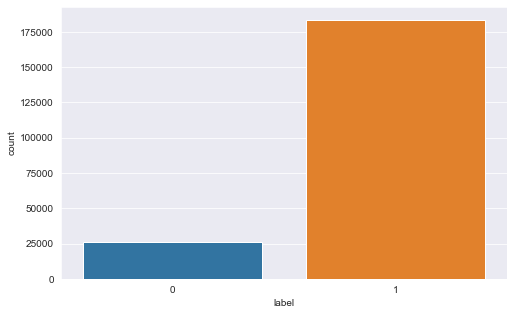

In [91]:
plt.figure(figsize=(8,5))
sns.countplot(x=y)
y.value_counts()

# Imbalance Dataset

In [92]:
from imblearn.over_sampling import SMOTE
smt=SMOTE()
x,y=smt.fit_resample(x,y)

0    183430
1    183430
Name: label, dtype: int64

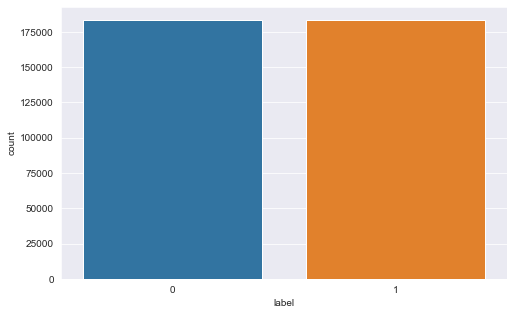

In [93]:
plt.figure(figsize=(8,5))
sns.countplot(x=y)
y.value_counts()

# Importing Library

In [94]:
# linear_model,train test and metrics
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix

# Clssifiers
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.linear_model import SGDClassifier

# cross Validation
from sklearn.model_selection import cross_val_score

# Ensamble
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier

# neural network
from sklearn.neural_network import MLPClassifier

# hyper paramter
from sklearn.model_selection import GridSearchCV

# Instance

In [96]:
lg=LogisticRegression()

# Find Train Test

In [97]:
for i in range(0,100):
    x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=i,test_size=0.20)
    #train and score
    lg.fit(x_train,y_train)
    lg.score(x_train,y_train)
    
    #predict train and test
    pred_train=lg.predict(x_train)
    pred_test=lg.predict(x_test)
    
    # loop
    if round(accuracy_score(y_train,pred_train)*100,1)==round(accuracy_score(y_test,pred_test)*100,1):
        print("The random state:-",i)
        print("Training accuracy_score is ",accuracy_score(y_train,pred_train)*100)
        print("Testing accuracy_score is ",accuracy_score(y_test,pred_test)*100,"\n")

The random state:- 9
Training accuracy_score is  74.47084718966363
Testing accuracy_score is  74.54614839448291 

The random state:- 13
Training accuracy_score is  74.50423867415364
Testing accuracy_score is  74.54614839448291 

The random state:- 19
Training accuracy_score is  74.50389794472005
Testing accuracy_score is  74.50389794472005 

The random state:- 22
Training accuracy_score is  74.50423867415364
Testing accuracy_score is  74.46573624816007 

The random state:- 24
Training accuracy_score is  74.49878700321648
Testing accuracy_score is  74.52979338167148 

The random state:- 25
Training accuracy_score is  74.50832742735648
Testing accuracy_score is  74.48754293190864 

The random state:- 26
Training accuracy_score is  74.5093496156572
Testing accuracy_score is  74.47527667230005 

The random state:- 27
Training accuracy_score is  74.51514201602791
Testing accuracy_score is  74.46709916589434 

The random state:- 33
Training accuracy_score is  74.50900888622363
Testing accura

In [111]:
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=73,test_size=0.20)

#sent for training
lg.fit(x_train,y_train)

#predict(x_training data)
pred_train=lg.predict(x_train) 
pred_test=lg.predict(x_test) 

#result
print("Accuracy Training Score =",accuracy_score(y_train,pred_train)," Accuracy Test Score =",accuracy_score(y_test,pred_test),"\n")
print("Training Confusion_Matrix \n",confusion_matrix(y_test,pred_test),'\n',"Testing Confusion_Matrix \n",confusion_matrix(y_test,pred_test),"\n")
print("Classification Report \n",classification_report(y_test,pred_test),'\n\n')

Accuracy Training Score = 0.7450151283868506  Accuracy Test Score = 0.7452297879300005 

Training Confusion_Matrix 
 [[29477  7186]
 [11507 25202]] 
 Testing Confusion_Matrix 
 [[29477  7186]
 [11507 25202]] 

Classification Report 
               precision    recall  f1-score   support

           0       0.72      0.80      0.76     36663
           1       0.78      0.69      0.73     36709

    accuracy                           0.75     73372
   macro avg       0.75      0.75      0.74     73372
weighted avg       0.75      0.75      0.74     73372
 




# Model Cross Validation

In [109]:
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy =accuracy_score(y_test,pred_test)

for i in range(2,10):
    cv_score=cross_val_score(lg,x,y,cv=i)
    cv_mean=cv_score.mean()
    
    print("A cross-fold ",i,"CV_mean ",cv_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

A cross-fold  2 CV_mean  0.7449381235348634 Training Score  0.7450594232132148 Testing Score  0.7459521343291718
A cross-fold  3 CV_mean  0.7449980923423342 Training Score  0.7450594232132148 Testing Score  0.7459521343291718
A cross-fold  4 CV_mean  0.7449844627378291 Training Score  0.7450594232132148 Testing Score  0.7459521343291718
A cross-fold  5 CV_mean  0.7450089952570462 Training Score  0.7450594232132148 Testing Score  0.7459521343291718
A cross-fold  6 CV_mean  0.7450825963214308 Training Score  0.7450594232132148 Testing Score  0.7459521343291718
A cross-fold  7 CV_mean  0.7451016725777319 Training Score  0.7450594232132148 Testing Score  0.7459521343291718
A cross-fold  8 CV_mean  0.7450526056816045 Training Score  0.7450594232132148 Testing Score  0.7459521343291718
A cross-fold  9 CV_mean  0.7450880435526491 Training Score  0.7450594232132148 Testing Score  0.7459521343291718


#### NOTE: Almost all the CV_Score is close to Training Score

- Selected Cross Fold 8 as Cv_Score is close to Training Score

In [110]:
# accuracy score
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

#score and mean
cv_score =cross_val_score(lg,x,y,cv=8)
cv_mean  =cv_score.mean()

# result
print("A cross-fold ",i,"cv_mean ",cv_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

A cross-fold  9 cv_mean  0.7450526056816045 Training Score  0.7450594232132148 Testing Score  0.7459521343291718


### AUC_ROC_Graph

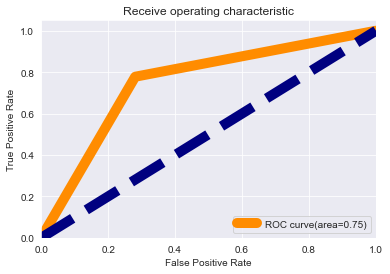

In [111]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds= roc_curve(pred_test,y_test)
roc_auc = auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve(area=%0.2f)' % roc_auc)

plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receive operating characteristic")
plt.legend(loc="lower right")
plt.show()

# Models Decision Tree 

In [130]:
#train and score
dtc.fit(x_train,y_train)
dtc_score=dtc.score(x_train,y_train)

#predict
pred_train=dtc.predict(x_train)
pred_test=dtc.predict(x_test)

#result
print("Training Score",dtc_score)
print("Accuracy Training Score =",accuracy_score(y_train,pred_train)," Accuracy Test Score =",accuracy_score(y_test,pred_test),"\n")
print("Training Confusion_Matrix \n",confusion_matrix(y_train,pred_train),"Testing Confusion_Matrix \n",confusion_matrix(y_test,pred_test))
print("Classification Report \n",classification_report(y_test,pred_test))

Training Score 0.9946709916589435
Accuracy Training Score = 0.9946709916589435  Accuracy Test Score = 0.8877092078722129 

Training Confusion_Matrix 
 [[146599    168]
 [  1396 145325]] Testing Confusion_Matrix 
 [[32886  3777]
 [ 4462 32247]]
Classification Report 
               precision    recall  f1-score   support

           0       0.88      0.90      0.89     36663
           1       0.90      0.88      0.89     36709

    accuracy                           0.89     73372
   macro avg       0.89      0.89      0.89     73372
weighted avg       0.89      0.89      0.89     73372



# Model Cross Validation

In [124]:
#train test Accuracy
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy =accuracy_score(y_test,pred_test)

#Range finding cv Score
for i in range(2,10):
    cv_score=cross_val_score(dtc,x,y,cv=i)
    cv_mean=cv_score.mean()
    
    print("A cross-fold ",i,"CV_mean ",cv_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

A cross-fold  2 CV_mean  0.8749522978793001 Training Score  0.9946709916589435 Testing Score  0.8876410619854985
A cross-fold  3 CV_mean  0.883347898694235 Training Score  0.9946709916589435 Testing Score  0.8876410619854985
A cross-fold  4 CV_mean  0.8857411546639045 Training Score  0.9946709916589435 Testing Score  0.8876410619854985
A cross-fold  5 CV_mean  0.8874747860219158 Training Score  0.9946709916589435 Testing Score  0.8876410619854985
A cross-fold  6 CV_mean  0.8885462026391627 Training Score  0.9946709916589435 Testing Score  0.8876410619854985
A cross-fold  7 CV_mean  0.8890095591505315 Training Score  0.9946709916589435 Testing Score  0.8876410619854985
A cross-fold  8 CV_mean  0.8888651352802871 Training Score  0.9946709916589435 Testing Score  0.8876410619854985
A cross-fold  9 CV_mean  0.8907733416489884 Training Score  0.9946709916589435 Testing Score  0.8876410619854985


In [125]:
# accuracy score
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

#score and mean
cv_score =cross_val_score(dtc,x,y,cv=8)
cv_mean  =cv_score.mean()

# result
print("A cross-fold ",i,"CV_mean ",cv_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

A cross-fold  9 CV_mean  0.8889769035993302 Training Score  0.9946709916589435 Testing Score  0.8876410619854985


## Model Graph

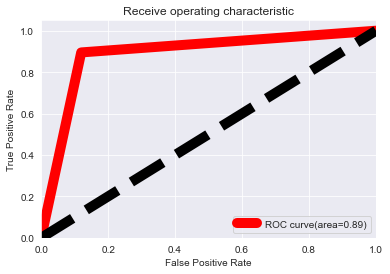

In [133]:
from sklearn.metrics import roc_curve,auc

fpr,tpr,thresholds= roc_curve(pred_test,y_test)
roc_auc =auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='red',lw=10,label='ROC curve(area=%0.2f)' % roc_auc)

plt.plot([0,1],[0,1],color='black',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receive operating characteristic")
plt.legend(loc="lower right")
plt.show()

## Ensamble Model 1 Extra Trees Classifier

In [136]:
# train and score
etc.fit(x_train,y_train)
etc_score=etc.score(x_train,y_train)

#predict
pred_train=etc.predict(x_train)
pred_test=etc.predict(x_test)

#result
print("Accuracy Training Score =",accuracy_score(y_train,pred_train)," Accuracy Test Score =",accuracy_score(y_test,pred_test),"\n")
print("Training Confusion_Matrix \n",confusion_matrix(y_train,pred_train),"Testing Confusion_Matrix \n",confusion_matrix(y_test,pred_test))
print("Classification Report \n",classification_report(y_test,pred_test))

Accuracy Training Score = 0.9946709916589435  Accuracy Test Score = 0.9300141743444366 

Training Confusion_Matrix 
 [[146599    168]
 [  1396 145325]] Testing Confusion_Matrix 
 [[34363  2300]
 [ 2835 33874]]
Classification Report 
               precision    recall  f1-score   support

           0       0.92      0.94      0.93     36663
           1       0.94      0.92      0.93     36709

    accuracy                           0.93     73372
   macro avg       0.93      0.93      0.93     73372
weighted avg       0.93      0.93      0.93     73372



## Model Cross Validation

In [137]:
#Accuracy_Score
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

#cross val
for i in range(2,10):
    cv_etc_score=cross_val_score(etc,x,y,cv=i)
    cv_mean=cv_etc_score.mean()
    
    #print
    print("A cross-fold ",i,"CV_Score ",cv_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

A cross-fold  2 CV_Score  0.9199776481491577 Training Score  0.9946709916589435 Testing Score  0.9300141743444366
A cross-fold  3 CV_Score  0.927612734716814 Training Score  0.9946709916589435 Testing Score  0.9300141743444366
A cross-fold  4 CV_Score  0.929687074088208 Training Score  0.9946709916589435 Testing Score  0.9300141743444366
A cross-fold  5 CV_Score  0.9317995965763508 Training Score  0.9946709916589435 Testing Score  0.9300141743444366
A cross-fold  6 CV_Score  0.9326692202195735 Training Score  0.9946709916589435 Testing Score  0.9300141743444366
A cross-fold  7 CV_Score  0.933015379455707 Training Score  0.9946709916589435 Testing Score  0.9300141743444366
A cross-fold  8 CV_Score  0.9330235846373753 Training Score  0.9946709916589435 Testing Score  0.9300141743444366
A cross-fold  9 CV_Score  0.933348017376646 Training Score  0.9946709916589435 Testing Score  0.9300141743444366


####  Selected Cv Fold 9 as Cv_score is close to training Score 

In [138]:
#Accuracy_Score
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

#cross val score
etc_cv_score=cross_val_score(etc,x,y,cv=9)
etc_mean=etc_cv_score.mean()

print(" CV_mean ",etc_mean,"Testing Accuracy Score ",test_accuracy)

 CV_mean  0.933252613685062 Testing Accuracy Score  0.9300141743444366


## Model Graph

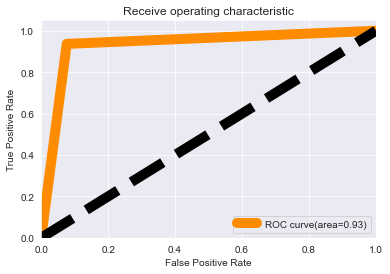

In [140]:
from sklearn.metrics import roc_curve,auc

fpr,tpr,thresholds= roc_curve(pred_test,y_test)
roc_auc =auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve(area=%0.2f)' % roc_auc)

plt.plot([0,1],[0,1],color='black',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receive operating characteristic")
plt.legend(loc="lower right")
plt.show()

# Model2: Random Forest Classifier

In [141]:
#random Forest Training and score
rfc.fit(x_train,y_train)
rfc_score=rfc.score(x_train,y_train)

#predict random Forest
pred_train=rfc.predict(x_train)
pred_test=rfc.predict(x_test)
      
#result random Forest
print("Accuracy Training Score =",accuracy_score(y_train,pred_train)," Accuracy Test Score =",accuracy_score(y_test,pred_test),"\n")
print("Training Confusion_Matrix \n",confusion_matrix(y_train,pred_train),"Testing Confusion_Matrix \n",confusion_matrix(y_test,pred_test))
print("Classification Report \n",classification_report(y_test,pred_test))

Accuracy Training Score = 0.9946301041269149  Accuracy Test Score = 0.9233222482690945 

Training Confusion_Matrix 
 [[146506    261]
 [  1315 145406]] Testing Confusion_Matrix 
 [[33953  2710]
 [ 2916 33793]]
Classification Report 
               precision    recall  f1-score   support

           0       0.92      0.93      0.92     36663
           1       0.93      0.92      0.92     36709

    accuracy                           0.92     73372
   macro avg       0.92      0.92      0.92     73372
weighted avg       0.92      0.92      0.92     73372



# Model Cross Validation

In [142]:
#train and score
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

#cross val for model
for i in range(2,10):
    cv_rfc_score=cross_val_score(rfc,x,y,cv=i)
    cv_mean=cv_rfc_score.mean()
    
    #print
    print("A cross-fold ",i,"CV_mean ",cv_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

A cross-fold  2 CV_mean  0.9138308891675299 Training Score  0.9946301041269149 Testing Score  0.9233222482690945
A cross-fold  3 CV_mean  0.9201521438883633 Training Score  0.9946301041269149 Testing Score  0.9233222482690945
A cross-fold  4 CV_mean  0.9216676661396718 Training Score  0.9946301041269149 Testing Score  0.9233222482690945
A cross-fold  5 CV_mean  0.9230496647222374 Training Score  0.9946301041269149 Testing Score  0.9233222482690945
A cross-fold  6 CV_mean  0.9239548196438722 Training Score  0.9946301041269149 Testing Score  0.9233222482690945
A cross-fold  7 CV_mean  0.9240556359598785 Training Score  0.9946301041269149 Testing Score  0.9233222482690945
A cross-fold  8 CV_mean  0.924761669554536 Training Score  0.9946301041269149 Testing Score  0.9233222482690945
A cross-fold  9 CV_mean  0.9254241718847608 Training Score  0.9946301041269149 Testing Score  0.9233222482690945


####  Selected Cv Fold 9 as Cv_score is close to training Score 

In [143]:
#train and score
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

# model cross val score
rfc_cv_score=cross_val_score(rfc,x,y,cv=9) 
rfc_mean=rfc_cv_score.mean()# mean value

print(" CV_mean ",rfc_mean,"Testing Accuracy Score ",test_accuracy)

 CV_mean  0.9252388147310953 Testing Accuracy Score  0.9233222482690945


## Model Graph

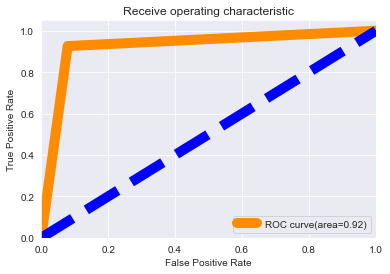

In [144]:
from sklearn.metrics import roc_curve,auc

fpr,tpr,thresholds= roc_curve(pred_test,y_test)
roc_auc =auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve(area=%0.2f)' % roc_auc)

plt.plot([0,1],[0,1],color='blue',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receive operating characteristic")
plt.legend(loc="lower right")
plt.show()

# Gradient Boosting Classfier

In [145]:
#train and score gradient Boosting Classifier
gbc.fit(x_train,y_train)
gbc_score=gbc.score(x_train,y_train)

#predict Gradient Boosting Classifier
pred_train=gbc.predict(x_train)
pred_test=gbc.predict(x_test)

#result gradient Boosting classifier
print("Accuracy Training Score =",accuracy_score(y_train,pred_train)," Accuracy Test Score =",accuracy_score(y_test,pred_test),"\n")
print("Training Confusion_Matrix \n",confusion_matrix(y_train,pred_train),"Testing Confusion_Matrix \n",confusion_matrix(y_test,pred_test))
print("Classification Report \n",classification_report(y_test,pred_test))

Accuracy Training Score = 0.858672245543259  Accuracy Test Score = 0.8586381725999018 

Training Confusion_Matrix 
 [[130948  15819]
 [ 25659 121062]] Testing Confusion_Matrix 
 [[32717  3946]
 [ 6426 30283]]
Classification Report 
               precision    recall  f1-score   support

           0       0.84      0.89      0.86     36663
           1       0.88      0.82      0.85     36709

    accuracy                           0.86     73372
   macro avg       0.86      0.86      0.86     73372
weighted avg       0.86      0.86      0.86     73372



### Model Cross Validation

In [146]:
#predict model 
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

#cross val
for i in range(2,10):
    cv_gbc_score=cross_val_score(gbc,x,y,cv=i)
    cv_mean=cv_gbc_score.mean()
    
    #print
    print("A cross-fold ",i,"CV_mean ",cv_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

A cross-fold  2 CV_mean  0.8555361718366679 Training Score  0.858672245543259 Testing Score  0.8586381725999018
A cross-fold  3 CV_mean  0.8578013604794669 Training Score  0.858672245543259 Testing Score  0.8586381725999018
A cross-fold  4 CV_mean  0.8570653655345364 Training Score  0.858672245543259 Testing Score  0.8586381725999018
A cross-fold  5 CV_mean  0.8573406749168621 Training Score  0.858672245543259 Testing Score  0.8586381725999018
A cross-fold  6 CV_mean  0.8577278487111225 Training Score  0.858672245543259 Testing Score  0.8586381725999018
A cross-fold  7 CV_mean  0.8570627130446804 Training Score  0.858672245543259 Testing Score  0.8586381725999018
A cross-fold  8 CV_mean  0.8574607130081753 Training Score  0.858672245543259 Testing Score  0.8586381725999018
A cross-fold  9 CV_mean  0.8568501972297855 Training Score  0.858672245543259 Testing Score  0.8586381725999018


#### Selected Cross Fold 9 as cv_score is close to training Score

In [147]:
#predict model 
train_accuracy=accuracy_score(y_train,pred_train)
test_accuracy=accuracy_score(y_test,pred_test)

#cross val score
gbc_cv_score=cross_val_score(gbc,x,y,cv=9)
gbc_mean=gbc_cv_score.mean()

print(" CV_mean ",gbc_mean,"Testing Accuracy Score ",test_accuracy)

 CV_mean  0.8568501972297855 Testing Accuracy Score  0.8586381725999018


### Model Auc_ROC_Graph

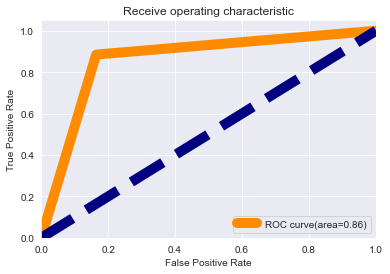

In [148]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds= roc_curve(pred_test,y_test)
roc_auc = auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve(area=%0.2f)' % roc_auc)

plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receive operating characteristic")
plt.legend(loc="lower right")
plt.show()

# * Hyper-Parameter With Model:*


- Model Selected is Random Forest and Extra Trees

- Model CV_Score is far better.
- Model Testing score and Training accuracy is far better then other Models.
- Model Cv_score is close to testing score

# Model 1 Random Forest Classifier

In [156]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

rfc= RandomForestClassifier()

#Parameter  
parameters={'n_estimators':[100],
            'criterion':['gini', 'entropy', 'log_loss'],
           'max_features':['sqrt', 'log2','None']}

gsv=GridSearchCV(rfc,parameters,verbose=1,cv=9)
gsv.fit(x_train,y_train)

print("Best Parameter ",gsv.best_params_,"Best Score ",gsv.best_score_)

Fitting 9 folds for each of 9 candidates, totalling 81 fits
Best Parameter  {'criterion': 'entropy', 'max_features': 'log2', 'n_estimators': 100} Best Score  0.9218945913028033


In [163]:
#random Forest Training and score
rfc=RandomForestClassifier(n_estimators=200, criterion='entropy', max_features='sqrt', min_samples_split=2,random_state=73,class_weight='balanced')
rfc.fit(x_train,y_train)
rfc_score=rfc.score(x_train,y_train)

#predict random Forest
pred_train1=rfc.predict(x_train)
pred_test1=rfc.predict(x_test)
      
#result random Forest
print("Model Score ",rfc_score)
print("Accuracy Training Score ",accuracy_score(y_train,pred_train1)," Accuracy Test Score ",accuracy_score(y_test,pred_test1),"\n")
print("Training Confusion_Matrix \n",confusion_matrix(y_train,pred_train1),"Testing Confusion_Matrix \n",confusion_matrix(y_test,pred_test1))
print("Classification Report \n",classification_report(y_test,pred_test1))

Model Score  0.9946709916589435
Accuracy Training Score  0.9946709916589435  Accuracy Test Score  0.9242899198604372 

Training Confusion_Matrix 
 [[146529    238]
 [  1326 145395]] Testing Confusion_Matrix 
 [[33967  2696]
 [ 2859 33850]]
Classification Report 
               precision    recall  f1-score   support

           0       0.92      0.93      0.92     36663
           1       0.93      0.92      0.92     36709

    accuracy                           0.92     73372
   macro avg       0.92      0.92      0.92     73372
weighted avg       0.92      0.92      0.92     73372



## Model Cross Validation

In [164]:
#Accuracy_Score
train_accuracy=accuracy_score(y_train,pred_train1)
test_accuracy=accuracy_score(y_test,pred_test1)

#cross val
for i in range(2,10):
    cv_etc_score=cross_val_score(etc,x,y,cv=i)
    cv_mean=cv_etc_score.mean()
    
    #print
    print("A cross-fold ",i,"CV_Score ",cv_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

A cross-fold  2 CV_Score  0.9197405004633921 Training Score  0.9946709916589435 Testing Score  0.9242899198604372
A cross-fold  3 CV_Score  0.9272120371704154 Training Score  0.9946709916589435 Testing Score  0.9242899198604372
A cross-fold  4 CV_Score  0.9298724309000709 Training Score  0.9946709916589435 Testing Score  0.9242899198604372
A cross-fold  5 CV_Score  0.9316524014610478 Training Score  0.9946709916589435 Testing Score  0.9242899198604372
A cross-fold  6 CV_Score  0.9324075395687669 Training Score  0.9946709916589435 Testing Score  0.9242899198604372
A cross-fold  7 CV_Score  0.9329963008439153 Training Score  0.9946709916589435 Testing Score  0.9242899198604372
A cross-fold  8 CV_Score  0.9330753766703923 Training Score  0.9946709916589435 Testing Score  0.9242899198604372
A cross-fold  9 CV_Score  0.9334216159373656 Training Score  0.9946709916589435 Testing Score  0.9242899198604372


#### Selected Cross Fold 9 as cv_score is close to training Score

In [166]:
test_accuracy=accuracy_score(y_test,pred_test1)

# model cross val score
rfc_cv_score=cross_val_score(rfc,x,y,cv=9) 
rfc_mean=rfc_cv_score.mean()# mean value

print(" CV_mean ",rfc_mean,"Testing Accuracy Score ",test_accuracy)

 CV_mean  0.9257758101213504 Testing Accuracy Score  0.9242899198604372


### Model Graph

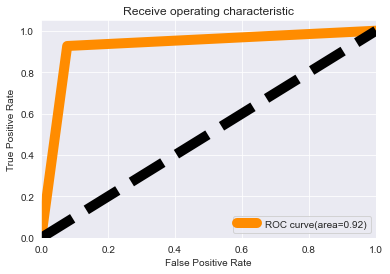

In [167]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds= roc_curve(pred_test1,y_test)
roc_auc = auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve(area=%0.2f)' % roc_auc)

plt.plot([0,1],[0,1],color='black',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receive operating characteristic")
plt.legend(loc="lower right")
plt.show()

# Model 2 : Extra Trees

In [169]:
# importing library Grid Search CV
from sklearn.model_selection import GridSearchCV

parameters={'n_estimators':[100],
             'criterion':['gini', 'entropy', 'log_loss'],
             'max_features':['sqrt','log2', 'None']}

gsv=GridSearchCV(etc,param_grid=parameters,cv=9,verbose=0)
gsv.fit(x_train,y_train)

print("Best Parameter ",gsv.best_params_,"Best Score ",gsv.best_score_)

Best Parameter  {'criterion': 'log_loss', 'max_features': 'log2', 'n_estimators': 100} Best Score  0.9271588579873357


In [186]:
etc=ExtraTreesClassifier(criterion='log_loss', max_features= 'log2', min_samples_split= 3 ,n_estimators= 200, n_jobs= 5,verbose=0,
                         max_depth=1036,min_samples_leaf=1,min_impurity_decrease=0.00000000001)

#train and score
etc.fit(x_train,y_train)
etc_score=etc.score(x_train,y_train)

#predict
pred_train2=etc.predict(x_train)
pred_test2=etc.predict(x_test)

#result
print("Training_Score",etc_score)
print("Training Accuracy_score ",accuracy_score(y_train,pred_train2)," Testing Accuracy_score ",accuracy_score(y_test,pred_test2))
print("Training Confusion_Matrics\n",confusion_matrix(y_train,pred_train2)," Testing Confusion Matrics\n ",confusion_matrix(y_test,pred_test2))
print("Classification Report \n",classification_report(y_test,pred_test2))

Training_Score 0.9935670282941722
Training Accuracy_score  0.9935670282941722  Testing Accuracy_score  0.9320176634138363
Training Confusion_Matrics
 [[146552    215]
 [  1673 145048]]  Testing Confusion Matrics
  [[34546  2117]
 [ 2871 33838]]
Classification Report 
               precision    recall  f1-score   support

           0       0.92      0.94      0.93     36663
           1       0.94      0.92      0.93     36709

    accuracy                           0.93     73372
   macro avg       0.93      0.93      0.93     73372
weighted avg       0.93      0.93      0.93     73372



## Model Cross Validation

In [187]:
#Accuracy_Score
train_accuracy=accuracy_score(y_train,pred_train2)
test_accuracy=accuracy_score(y_test,pred_test2)

#cross val
for i in range(2,10):
    cv_etc_score=cross_val_score(etc,x,y,cv=i)
    cv_mean=cv_etc_score.mean()
    
    #print
    print("A cross-fold ",i,"CV_Score ",cv_mean,"Training Score ",train_accuracy,"Testing Score ",test_accuracy)

A cross-fold  2 CV_Score  0.9215177451889004 Training Score  0.9935670282941722 Testing Score  0.9320176634138363
A cross-fold  3 CV_Score  0.9291092195704836 Training Score  0.9935670282941722 Testing Score  0.9320176634138363
A cross-fold  4 CV_Score  0.9319059041596249 Training Score  0.9935670282941722 Testing Score  0.9320176634138363
A cross-fold  5 CV_Score  0.9338685056969961 Training Score  0.9935670282941722 Testing Score  0.9320176634138363
A cross-fold  6 CV_Score  0.9346209229475712 Training Score  0.9935670282941722 Testing Score  0.9320176634138363
A cross-fold  7 CV_Score  0.9352914553563149 Training Score  0.9935670282941722 Testing Score  0.9320176634138363
A cross-fold  8 CV_Score  0.9351061228167284 Training Score  0.9935670282941722 Testing Score  0.9320176634138363
A cross-fold  9 CV_Score  0.9353433367414294 Training Score  0.9935670282941722 Testing Score  0.9320176634138363


#### Selected Cross Fold 9 as cv_score is close to training Score

In [188]:
#Accuracy_Score
test_accuracy=accuracy_score(y_test,pred_test2)

#cross val score
etc_cv_score=cross_val_score(etc,x,y,cv=9)
etc_mean=etc_cv_score.mean()

print(" CV_mean ",etc_mean,"Testing Accuracy Score ",test_accuracy)

 CV_mean  0.9354823547069847 Testing Accuracy Score  0.9320176634138363


# Model Graph

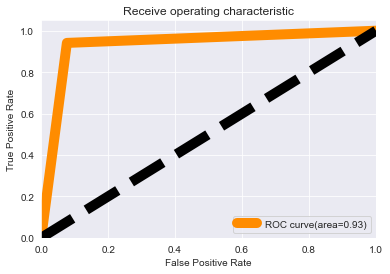

In [189]:
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds= roc_curve(pred_test2,y_test)
roc_auc = auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC curve(area=%0.2f)' % roc_auc)

plt.plot([0,1],[0,1],color='black',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receive operating characteristic")
plt.legend(loc="lower right")
plt.show()

# Saving Model

In [190]:
import pickle
filename='micro_fin.pkl'
pickle.dump(etc,open(filename,'wb'))

### Loading Model

In [191]:
# loading pack file
pickled_model= pickle.load(open(filename,'rb'))
result=pickled_model.score(x_test,y_test)
result

0.9320176634138363

In [192]:
result*100

93.20176634138363

In [193]:
conclude=pd.DataFrame([pickled_model.predict(x_test)[:],pred_test2[:]],index=['Predicted','Original'])
conclude

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021